# Model Experiments

In [1]:
#Defining Path

cbis_path = 'DS/CBIS_DDSM'

In [2]:
from keras.callbacks import ModelCheckpoint
import shutil

In [1]:
# Import libraries


import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, Callback
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop, SGD, Adam, Adadelta, Adagrad, Adamax, Nadam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model



import json
import pandas as pd

# Data Exploration

### Explorating the Training Features

In [6]:
# Load the train_tensor.npy file
train_tensor_path = 'CBIS_DDSM/numpy data/train_tensor.npy' 
train_tensor_with_patches = np.load(train_tensor_path)
train_tensor_without_patches = train_tensor_with_patches[1::2] # The abnormal images
train_tensor_baseline_patches = train_tensor_with_patches[::2] #The normal images

#### All the training features

In [ ]:

# Display the shape and the first few elements of the training tensor to understand its content
train_tensor_shape = train_tensor_with_patches.shape
train_tensor_sample = train_tensor_with_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training images with baseline patches:", train_tensor_shape)
print("Sample of training images data with baseline patches:", train_tensor_sample)

Shape of the training images with baseline patches: (5352, 150, 150)
Sample of training images data with baseline patches: [[[40798 42031 40952 ... 41634 43418 42339]
  [39675 40401 39829 ... 42581 40644 42669]
  [39168 38134 39168 ... 40247 42427 42053]
  ...
  [42229 42955 42229 ... 44739 43704 44056]
  [40886 41040 42251 ... 43462 44034 44144]
  [42207 42185 42009 ... 43704 43506 43792]]

 [[28072 27191 27962 ... 39036 40644 41238]
  [27455 28644 28050 ... 40820 40600 40093]
  [27279 26927 26399 ... 40379 40159 40115]
  ...
  [30604 30252 30626 ... 39256 41854 41304]
  [28754 30384 30494 ... 39367 39763 40511]
  [30626 30626 32321 ... 40005 40666 40798]]

 [[38486 37957 38508 ... 42999 43264 42471]
  [38310 39058 40203 ... 44056 42295 41656]
  [39675 39234 40291 ... 43065 43660 42141]
  ...
  [34589 34325 32850 ... 44937 44739 43374]
  [33884 34589 33950 ... 44739 44166 45113]
  [33862 34677 33972 ... 44563 43616 43946]]

 [[38970 37759 37363 ... 37055 37847 38178]
  [38024 38332 37

#### All the Training Abnormal Features

In [ ]:
# Display the shape and the first few elements of the training tensor to understand its content
train_tensor_without_patches_shape = train_tensor_without_patches.shape
train_tensor_without_patches_sample = train_tensor_without_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training images without baseline patches:", train_tensor_without_patches_shape)
print("Sample of training images data without baseline patches:", train_tensor_without_patches_sample)

Shape of the training images without baseline patches: (2676, 150, 150)
Sample of training images data without baseline patches: [[[28072 27191 27962 ... 39036 40644 41238]
  [27455 28644 28050 ... 40820 40600 40093]
  [27279 26927 26399 ... 40379 40159 40115]
  ...
  [30604 30252 30626 ... 39256 41854 41304]
  [28754 30384 30494 ... 39367 39763 40511]
  [30626 30626 32321 ... 40005 40666 40798]]

 [[38970 37759 37363 ... 37055 37847 38178]
  [38024 38332 37253 ... 38794 38904 38882]
  [39565 39367 38904 ... 39697 39367 39675]
  ...
  [32872 32475 33928 ... 34237 35337 34941]
  [33444 32762 33510 ... 34083 35668 33730]
  [32651 32960 33620 ... 33708 34787 34435]]

 [[43606 44111 41842 ... 36506 35896 35791]
  [43207 42808 43102 ... 36485 36485 36695]
  [42703 42892 43669 ... 36716 36211 36569]
  ...
  [37997 37094 35917 ... 31968 31506 32031]
  [36905 36716 35581 ... 31947 31737 31085]
  [36800 36295 35371 ... 32115 32262 31527]]

 [[38123 38522 38123 ... 36485 37472 38165]
  [37976 38

#### All the Training Normal Features

In [ ]:
# Display the shape and the first few elements of the training tensor to understand its content
train_tensor_baseline_shape = train_tensor_baseline_patches.shape
train_tensor_baseline_sample = train_tensor_baseline_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training images of baseline patches:", train_tensor_baseline_shape)
print("Sample of training images data of baseline patches:", train_tensor_baseline_sample)

Shape of the training images of baseline patches: (2676, 150, 150)
Sample of training images data of baseline patches: [[[40798 42031 40952 ... 41634 43418 42339]
  [39675 40401 39829 ... 42581 40644 42669]
  [39168 38134 39168 ... 40247 42427 42053]
  ...
  [42229 42955 42229 ... 44739 43704 44056]
  [40886 41040 42251 ... 43462 44034 44144]
  [42207 42185 42009 ... 43704 43506 43792]]

 [[38486 37957 38508 ... 42999 43264 42471]
  [38310 39058 40203 ... 44056 42295 41656]
  [39675 39234 40291 ... 43065 43660 42141]
  ...
  [34589 34325 32850 ... 44937 44739 43374]
  [33884 34589 33950 ... 44739 44166 45113]
  [33862 34677 33972 ... 44563 43616 43946]]

 [[36443 36905 37451 ... 38880 38123 38438]
  [38249 38312 38018 ... 38543 38375 38796]
  [37556 37997 37640 ... 38396 38711 39090]
  ...
  [31758 32283 32451 ... 36947 36758 36800]
  [31611 32661 32451 ... 36295 37094 37073]
  [31863 31968 32451 ... 36527 36527 36674]]

 [[38648 38943 38081 ... 33375 34384 33901]
  [39237 38690 38753 

#### Displaying The Training Images of Both The Abnormal and Normal features

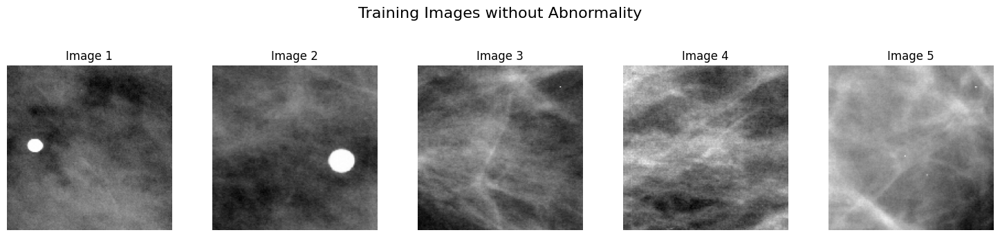

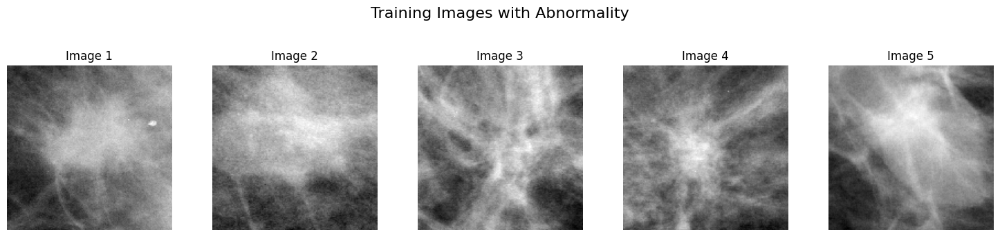

In [ ]:
# Function to display images
def display_images(images, title, num_images=5):
    plt.figure(figsize=(15, 6))
    plt.suptitle(title, fontsize=16)
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(f'Image {i + 1}')
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Display the first 5 images from the train_tensor with patches
display_images(train_tensor_baseline_patches, title="Training Images without Abnormality", num_images=5)

# Display the first 5 images from the train_tensor without patches
display_images(train_tensor_without_patches, title="Training Images with Abnormality", num_images=5)


#### Selecting the entire train labels

In [ ]:
# Load the train_tensor.npy file
train_labels_path = '/content/CBIS_DDSM/numpy data/train_labels.npy'
train_labels_with_patches = np.load(train_labels_path)
train_labels_without_patches = train_labels_with_patches[1::2] # The abnormal images
train_labels_baseline_patches = train_labels_with_patches[::2] #The normal images

#### Displaying The Entire Train Labels

In [ ]:
# Display the shape and the first few elements of the training labels to understand its content
train_labels_shape = train_labels_with_patches.shape
train_labels_sample = train_labels_with_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training images labels with baseline patches:", train_labels_shape)
print("Sample of training images data labels with baseline patches:", train_labels_sample)

Shape of the training images labels with baseline patches: (5352,)
Sample of training images data labels with baseline patches: [0 2 0 2 0]


#### Displaying The Train Abnormal Labels

In [ ]:
# Display the shape and the first few elements of the training labels to understand its content
train_labels_without_patches_shape = train_labels_without_patches.shape
train_labels_without_patches_sample = train_labels_without_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training abnormal images labels:", train_labels_without_patches_shape)
print("Sample of training abnormal images data labels:", train_labels_without_patches_sample)

Shape of the training abnormal images labels: (2676,)
Sample of training abnormal images data labels: [2 2 1 1 1]


#### Displaying The Train Normal Labels

In [ ]:
# Display the shape and the first few elements of the training labels to understand its content
train_labels_baseline_shape = train_labels_baseline_patches.shape
train_labels_baseline_sample = train_labels_baseline_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the training images of baseline patches:", train_labels_baseline_shape)
print("Sample of training images data of baseline patches:", train_labels_baseline_sample)

Shape of the training images of baseline patches: (2676,)
Sample of training images data of baseline patches: [0 0 0 0 0]


## Exploring the Test Dataset

#### Selecting the Entire Test Data Features

In [ ]:
# Load the test_tensor.npy file
test_tensor_path = '/content/CBIS_DDSM/numpy data/public_test_tensor.npy'
test_tensor_with_patches = np.load(test_tensor_path)
test_tensor_without_patches = test_tensor_with_patches[1::2] # The abnormal images
test_tensor_baseline_patches = test_tensor_with_patches[::2] #The normal images

#### Printing the Entire Test Data Features

In [ ]:
# Display the shape and the first few elements of the test tensor to understand its content
test_tensor_shape = test_tensor_with_patches.shape
test_tensor_sample = test_tensor_with_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test images with baseline patches:", test_tensor_shape)
print("Sample of test images data with baseline patches:", test_tensor_sample)

Shape of the test images with baseline patches: (672, 150, 150)
Sample of test images data with baseline patches: [[[41464 41569 41422 ... 36485 36737 35770]
  [41106 41148 41569 ... 36043 36064 35140]
  [41359 41443 41989 ... 35686 35812 35287]
  ...
  [44405 44384 43501 ... 36632 36148 35497]
  [43943 44027 44027 ... 36653 36779 36527]
  [43943 44090 44468 ... 36380 35812 36043]]

 [[43270 43859 43880 ... 36169 35833 35791]
  [43102 44321 43796 ... 36779 37409 37598]
  [42997 43165 42703 ... 37409 37514 38480]
  ...
  [20098 20287 20098 ... 24825 25434 26358]
  [19363 19279 19762 ... 25413 25455 26632]
  [19804 19615 18501 ... 25182 25308 26022]]

 [[47577 47115 46863 ... 48712 48018 48375]
  [47031 47493 46800 ... 48985 48901 49279]
  [47514 47808 47871 ... 48754 48712 48817]
  ...
  [47115 47136 47178 ... 49993 49615 49195]
  [46863 46212 46716 ... 49909 49531 48375]
  [46737 46254 46380 ... 48985 48606 47661]]

 [[48354 48775 49111 ... 40833 41548 41422]
  [48880 48585 48165 ... 4

#### Printing the Abnormal Test Data Features

In [ ]:
# Display the shape and the first few elements of the test tensor to understand its content
test_tensor_without_patches_shape = test_tensor_without_patches.shape
test_tensor_without_patches_sample = test_tensor_without_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test images without baseline patches:", test_tensor_without_patches_shape)
print("Sample of test images data without baseline patches:", test_tensor_without_patches_sample)

Shape of the test images without baseline patches: (336, 150, 150)
Sample of test images data without baseline patches: [[[43270 43859 43880 ... 36169 35833 35791]
  [43102 44321 43796 ... 36779 37409 37598]
  [42997 43165 42703 ... 37409 37514 38480]
  ...
  [20098 20287 20098 ... 24825 25434 26358]
  [19363 19279 19762 ... 25413 25455 26632]
  [19804 19615 18501 ... 25182 25308 26022]]

 [[48354 48775 49111 ... 40833 41548 41422]
  [48880 48585 48165 ... 40707 41926 41359]
  [47850 47955 47997 ... 41211 41422 41232]
  ...
  [49909 50371 49237 ... 45455 45854 45728]
  [49237 48880 49174 ... 45791 45455 45224]
  [48459 48039 47829 ... 44552 44153 44594]]

 [[32299 31396 30890 ... 31661 30560 31617]
  [30934 31110 31110 ... 31595 30890 31352]
  [31837 32189 31727 ... 31374 31440 30560]
  ...
  [31286 30384 30824 ... 30648 31308 30582]
  [30097 29899 30186 ... 30582 29855 31022]
  [30582 30450 29767 ... 30582 30230 30075]]

 [[32387 32343 31793 ... 32299 31529 31551]
  [32894 32784 32673

#### Printing the Normal Test Data Features

In [ ]:
# Display the shape and the first few elements of the test tensor to understand its content
test_tensor_baseline_shape = test_tensor_baseline_patches.shape
test_tensor_baseline_sample = test_tensor_baseline_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test images of baseline patches:", test_tensor_baseline_shape)
print("Sample of test images data of baseline patches:", test_tensor_baseline_sample)

Shape of the test images of baseline patches: (336, 150, 150)
Sample of test images data of baseline patches: [[[41464 41569 41422 ... 36485 36737 35770]
  [41106 41148 41569 ... 36043 36064 35140]
  [41359 41443 41989 ... 35686 35812 35287]
  ...
  [44405 44384 43501 ... 36632 36148 35497]
  [43943 44027 44027 ... 36653 36779 36527]
  [43943 44090 44468 ... 36380 35812 36043]]

 [[47577 47115 46863 ... 48712 48018 48375]
  [47031 47493 46800 ... 48985 48901 49279]
  [47514 47808 47871 ... 48754 48712 48817]
  ...
  [47115 47136 47178 ... 49993 49615 49195]
  [46863 46212 46716 ... 49909 49531 48375]
  [46737 46254 46380 ... 48985 48606 47661]]

 [[31154 31617 31859 ... 31440 31573 31110]
  [31463 31176 30384 ... 30868 31661 31969]
  [30846 30296 31000 ... 31661 31000 31352]
  ...
  [29679 29547 29723 ... 31418 31154 29503]
  [29833 29151 29569 ... 30384 30141 29019]
  [31396 30956 30802 ... 30097 29899 30384]]

 [[31154 31154 32167 ... 34347 34721 34347]
  [31242 32123 31264 ... 34016

#### Displaying the Images of Both Normal and Abnormal Test Data Features

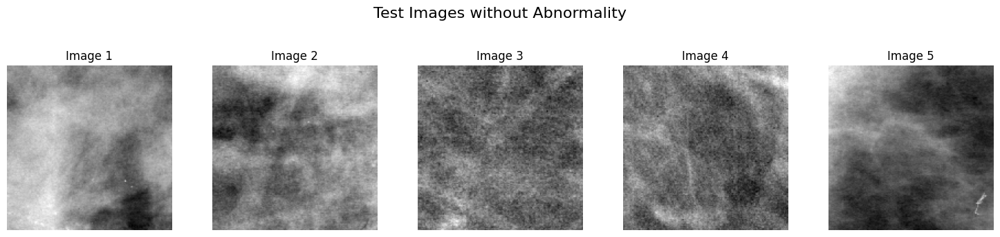

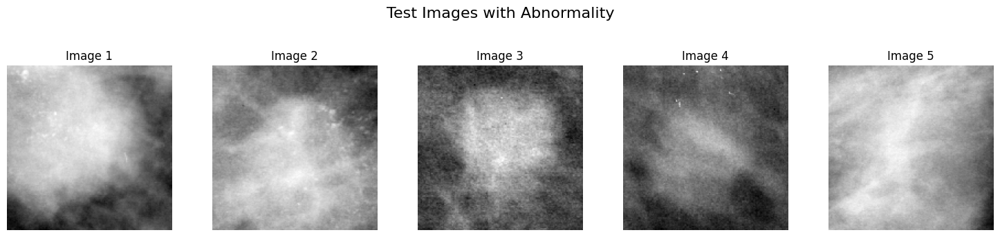

In [ ]:
# Function to display images
def display_images(images, title, num_images=5):
    plt.figure(figsize=(15, 6))
    plt.suptitle(title, fontsize=16)
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(f'Image {i + 1}')
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Display the first 5 images from the train_tensor with patches
display_images(test_tensor_baseline_patches, title="Test Images without Abnormality", num_images=5)

# Display the first 5 images from the train_tensor without patches
display_images(test_tensor_without_patches, title="Test Images with Abnormality", num_images=5)

#### Selecting the entire test labels

In [ ]:
# Load the test_labels.npy file
test_labels_path = '/content/CBIS_DDSM/numpy data/public_test_labels.npy'
test_labels_with_patches = np.load(test_labels_path)
test_labels_without_patches = test_labels_with_patches[1::2] # The abnormal images
test_labels_baseline_patches = test_labels_with_patches[::2] #The normal images

#### Displaying The Entire Test Labels

In [ ]:
# Display the shape and the first few elements of the test label to understand its content
test_labels_shape = test_labels_with_patches.shape
test_labels_sample = test_labels_with_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test images labels with baseline patches:", test_labels_shape)
print("Sample of test images data labels with baseline patches:", test_labels_sample)

Shape of the test images labels with baseline patches: (672,)
Sample of test images data labels with baseline patches: [0 2 0 2 0]


#### Displaying The Test Abnormal Labels

In [ ]:
#For FUN
# Display the shape and the first few elements of the test label to understand its content
test_labels_without_patches_shape = test_labels_without_patches.shape
test_labels_without_patches_sample = test_labels_without_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test abnormal images labels:", test_labels_without_patches_shape)
print("Sample of test abnormal images data labels:", test_labels_without_patches_sample)

Shape of the test abnormal images labels: (336,)
Sample of test abnormal images data labels: [2 2 2 2 1]


#### Displaying The Test Normal Labels

In [ ]:
#For FUN
# Display the shape and the first few elements of the test tensor to understand its content
test_labels_baseline_shape = test_labels_baseline_patches.shape
test_labels_baseline_sample = test_labels_baseline_patches[:5]  # Display the first 5 elements for brevity
print("Shape of the test images of baseline patches:", test_labels_baseline_shape)
print("Sample of test images data of baseline patches:", test_labels_baseline_sample)

Shape of the test images of baseline patches: (336,)
Sample of test images data of baseline patches: [0 0 0 0 0]


# Data pre-processing

In [4]:
def load_training():
    """
    Load the training set (excluding baseline patches i.e, images that are not abnormal)
    """
    images = np.load(os.path.join(cbis_path, 'numpy data', 'train_tensor.npy'))[1::2]
    labels = np.load(os.path.join(cbis_path, 'numpy data', 'train_labels.npy'))[1::2]
    return images, labels


def load_testing():
    """
    Load the test set (abnormalities patches and labels, no baseline i.e, no normal images)
    """
    images = np.load(os.path.join(cbis_path, 'numpy data', 'public_test_tensor.npy'))[1::2]
    labels = np.load(os.path.join(cbis_path, 'numpy data', 'public_test_labels.npy'))[1::2]
    return images, labels


def remap_label(l):
    """
    Remap the labels to 0->mass 1->calcification
    """
    if l == 1 or l == 2:
        return 0
    elif l == 3 or l == 4:
        return 1
    else:
        print("[WARN] Unrecognized label (%d)" % l)
        return None

In [5]:
# Load training and test images (abnormalities only, no baseline)
train_images, train_labels= load_training()
test_images, test_labels= load_testing()

# Number of images
n_train_img = train_images.shape[0]
n_test_img = test_images.shape[0]
print("Train size: %d \t Test size: %d" % (n_train_img, n_test_img))

# Compute width and height of images
img_w = train_images.shape[1]
img_h = train_images.shape[2]
print("Image size: %dx%d" % (img_w, img_h))

# Remap labels
train_labels = np.array([remap_label(l) for l in train_labels])
test_labels = np.array([remap_label(l) for l in test_labels])

# Create a new dimension for color in the images arrays
train_images = train_images.reshape((n_train_img, img_w, img_h, 1))
test_images = test_images.reshape((n_test_img, img_w, img_h, 1))

# Convert from 16-bit (0-65535) to float (0-1)
train_images = train_images.astype('uint16') / 65535
test_images = test_images.astype('uint16') / 65535

# Shuffle the training set (originally sorted by label)
perm = np.random.permutation(n_train_img)
train_images = train_images[perm]
train_labels = train_labels[perm]

# Create a generator for training images
train_datagen = ImageDataGenerator(
    validation_split=0.2
)

# Fit the generator with some images
train_datagen.fit(train_images)

# Split train images into actual training and validation
train_generator = train_datagen.flow(train_images, train_labels, batch_size=32, subset='training')
validation_generator = train_datagen.flow(train_images, train_labels, batch_size=32, subset='validation')

Train size: 2676 	 Test size: 336
Image size: 150x150


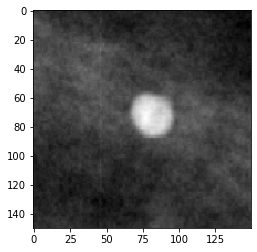

Label: 1


In [9]:
# Visualize one image from the dataset and its label, just to make sure the data format is correct

idx = 0

plt.imshow(train_images[idx][:,:,0], cmap='gray')
plt.show()

print("Label: " + str(train_labels[idx]))

# Classification of The Images

## Experiment 0

In [7]:
# Build a simple model

model_0 = models.Sequential()
model_0.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_0.add(layers.MaxPooling2D((2, 2)))
model_0.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_0.add(layers.MaxPooling2D((2, 2)))
model_0.add(layers.Flatten())
model_0.add(layers.Dense(16, activation='relu'))
model_0.add(layers.Dense(1, activation='sigmoid'))

model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 82944)             0         
                                                                 
 dense (Dense)               (None, 16)                1

In [8]:
# Callback for checkpointing
checkpoint = ModelCheckpoint('model_0_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_0.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_0 = model_0.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 32,
        epochs=100,
        validation_data=validation_generator,
        callbacks=[checkpoint],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)


<ipython-input-8-8742f8a583e2>:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_0 = model_0.fit_generator(


Epoch 1/100
66/66 [==============================] - ETA: 0s - loss: 0.8276 - accuracy: 0.5320
Epoch 1: val_loss improved from inf to 0.68806, saving model to model_0_2cl_best.h5
66/66 [==============================] - 57s 811ms/step - loss: 0.8276 - accuracy: 0.5320 - val_loss: 0.6881 - val_accuracy: 0.5533
Epoch 2/100
66/66 [==============================] - ETA: 0s - loss: 0.6907 - accuracy: 0.5410
Epoch 2: val_loss improved from 0.68806 to 0.68772, saving model to model_0_2cl_best.h5
66/66 [==============================] - 53s 805ms/step - loss: 0.6907 - accuracy: 0.5410 - val_loss: 0.6877 - val_accuracy: 0.5533
Epoch 3/100
66/66 [==============================] - ETA: 0s - loss: 0.6824 - accuracy: 0.5405
Epoch 3: val_loss improved from 0.68772 to 0.67209, saving model to model_0_2cl_best.h5
66/66 [==============================] - 52s 790ms/step - loss: 0.6824 - accuracy: 0.5405 - val_loss: 0.6721 - val_accuracy: 0.5533
Epoch 4/100
66/66 [==============================] - ETA: 0

In [9]:
# Save the final model
model_0.save('model_0_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_0_2cl_best.h5', os.path.join(destination_dir, 'model_0_2cl_best.h5'))
shutil.copy('model_0_2cl_end.h5', os.path.join(destination_dir, 'model_0_2cl_end.h5'))

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_0_2cl_end.h5'

In [10]:
# History of accuracy and loss
tra_loss_0 = history_0.history['loss']
tra_acc_0 = history_0.history['accuracy']  # changed 'acc' to 'accuracy'
val_loss_0 = history_0.history['val_loss']
val_acc_0 = history_0.history['val_accuracy']  # changed 'val_acc' to 'val_accuracy'

# Total number of epochs training
epochs_0 = range(1, len(tra_acc_0) + 1)
end_epoch_0 = len(tra_acc_0)

# Epoch when reached the validation loss minimum
opt_epoch_0 = val_loss_0.index(min(val_loss_0)) + 1

# Loss and accuracy on the validation set
end_val_loss_0 = val_loss_0[-1]
end_val_acc_0 = val_acc_0[-1]
opt_val_loss_0 = val_loss_0[opt_epoch_0 - 1]
opt_val_acc_0 = val_acc_0[opt_epoch_0 - 1]

# Loss and accuracy on the test set
opt_model_0 = models.load_model('model_0_2cl_best.h5')
test_loss_0, test_acc_0 = model_0.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_0, opt_test_acc_0 = opt_model_0.evaluate(test_images, test_labels, verbose=False)
opt_pred_0 = opt_model_0.predict(test_images)  # changed to pass only test_images
pred_classes_0 = np.rint(opt_pred_0)

print("Model 0\n")

print("Epoch [end]: %d" % end_epoch_0)
print("Epoch [opt]: %d" % opt_epoch_0)
print("Valid accuracy [end]: %.4f" % end_val_acc_0)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_0)
print("Test accuracy [end]:  %.4f" % test_acc_0)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_0)
print("Valid loss [end]: %.4f" % end_val_loss_0)
print("Valid loss [opt]: %.4f" % opt_val_loss_0)
print("Test loss [end]:  %.4f" % test_loss_0)
print("Test loss [opt]:  %.4f" % opt_test_loss_0)

print(classification_report(test_labels, pred_classes_0, digits=4))


Model 0

Epoch [end]: 100
Epoch [opt]: 70
Valid accuracy [end]: 0.8617
Valid accuracy [opt]: 0.8636
Test accuracy [end]:  0.8155
Test accuracy [opt]:  0.8125
Valid loss [end]: 0.4413
Valid loss [opt]: 0.3840
Test loss [end]:  0.7949
Test loss [opt]:  0.6238
              precision    recall  f1-score   support

           0     0.8494    0.7877    0.8174       179
           1     0.7765    0.8408    0.8073       157

    accuracy                         0.8125       336
   macro avg     0.8129    0.8142    0.8124       336
weighted avg     0.8153    0.8125    0.8127       336



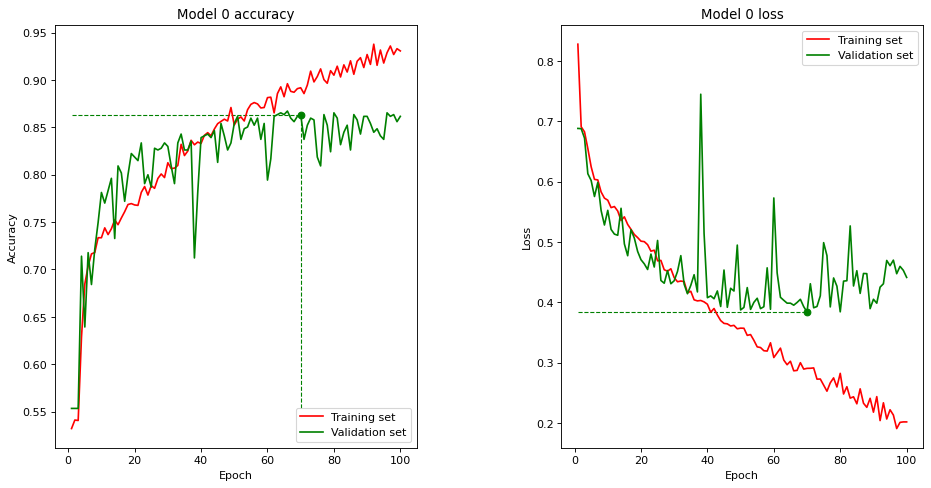

In [11]:
import matplotlib.pyplot as plt

# Assuming these variables are defined: epochs_0, tra_acc_0, val_acc_0, opt_epoch_0, opt_val_acc_0, tra_loss_0, val_loss_0, opt_val_loss_0

fig, ax = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')

# Model accuracy
ax[0].set_title('Model 0 accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].plot(epochs_0, tra_acc_0, 'r', label='Training set')
ax[0].plot(epochs_0, val_acc_0, 'g', label='Validation set')
ax[0].plot(opt_epoch_0, val_acc_0[opt_epoch_0-1], 'go')
ax[0].vlines(opt_epoch_0, min(val_acc_0), opt_val_acc_0, linestyle="dashed", color='g', linewidth=1)
ax[0].hlines(opt_val_acc_0, 1, opt_epoch_0, linestyle="dashed", color='g', linewidth=1)
ax[0].legend(loc='lower right')

# Model loss
ax[1].set_title('Model 0 loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].plot(epochs_0, tra_loss_0, 'r', label='Training set')
ax[1].plot(epochs_0, val_loss_0, 'g', label='Validation set')
ax[1].plot(opt_epoch_0, val_loss_0[opt_epoch_0-1], 'go')
ax[1].vlines(opt_epoch_0, min(val_loss_0), opt_val_loss_0, linestyle="dashed", color='g', linewidth=1)
ax[1].hlines(opt_val_loss_0, 1, opt_epoch_0, linestyle="dashed", color='g', linewidth=1)
ax[1].legend()

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.4)

plt.show()

## Experiment 1

In [12]:
# Model 1

model_1 = models.Sequential()
model_1.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Flatten())
model_1.add(layers.Dense(16, activation='relu'))
model_1.add(layers.Dropout(0.5))
model_1.add(layers.Dense(1, activation='sigmoid'))

model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 82944)             0         
                                                                 
 dense_2 (Dense)             (None, 16)               

In [13]:
# Callback for checkpointing
checkpoint = ModelCheckpoint('model_1_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_1.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_1 = model_1.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 32,
        epochs=100,
        validation_data=validation_generator,
        callbacks=[checkpoint],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)


# Save the final model
model_1.save('model_1_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_1_2cl_best.h5', os.path.join(destination_dir, 'model_1_2cl_best.h5'))
shutil.copy('model_1_2cl_end.h5', os.path.join(destination_dir, 'model_1_2cl_end.h5'))

Epoch 1/100


<ipython-input-13-71997e1e0ad3>:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_1 = model_1.fit_generator(


66/66 [==============================] - ETA: 0s - loss: 0.7784 - accuracy: 0.5367
Epoch 1: val_loss improved from inf to 0.69032, saving model to model_1_2cl_best.h5
66/66 [==============================] - 54s 792ms/step - loss: 0.7784 - accuracy: 0.5367 - val_loss: 0.6903 - val_accuracy: 0.5533
Epoch 2/100
66/66 [==============================] - ETA: 0s - loss: 0.6926 - accuracy: 0.5391
Epoch 2: val_loss did not improve from 0.69032
66/66 [==============================] - 51s 778ms/step - loss: 0.6926 - accuracy: 0.5391 - val_loss: 0.6907 - val_accuracy: 0.5533
Epoch 3/100
66/66 [==============================] - ETA: 0s - loss: 0.6942 - accuracy: 0.5401
Epoch 3: val_loss improved from 0.69032 to 0.68874, saving model to model_1_2cl_best.h5
66/66 [==============================] - 52s 785ms/step - loss: 0.6942 - accuracy: 0.5401 - val_loss: 0.6887 - val_accuracy: 0.5533
Epoch 4/100
66/66 [==============================] - ETA: 0s - loss: 0.6937 - accuracy: 0.5443
Epoch 4: val_loss

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_1_2cl_end.h5'

In [14]:
# History of accuracy and loss
tra_loss_1 = history_1.history['loss']
tra_acc_1 = history_1.history['accuracy']
val_loss_1 = history_1.history['val_loss']
val_acc_1 = history_1.history['val_accuracy']

# Total number of epochs training
epochs_1 = range(1, len(tra_acc_1)+1)
end_epoch_1 = len(tra_acc_1)

# Epoch when reached the validation loss minimum
opt_epoch_1 = val_loss_1.index(min(val_loss_1)) + 1

# Loss and accuracy on the validation set
end_val_loss_1 = val_loss_1[-1]
end_val_acc_1 = val_acc_1[-1]
opt_val_loss_1 = val_loss_1[opt_epoch_1-1]
opt_val_acc_1 = val_acc_1[opt_epoch_1-1]

# Loss and accuracy on the test set
opt_model_1 = models.load_model('model_1_2cl_best.h5')
test_loss_1, test_acc_1 = model_1.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_1, opt_test_acc_1 = opt_model_1.evaluate(test_images, test_labels, verbose=False)
opt_pred_1 = opt_model_1.predict(test_images)
pred_classes_1 = np.rint(opt_pred_1)

print("Model 1\n")

print("Epoch [end]: %d" % end_epoch_1)
print("Epoch [opt]: %d" % opt_epoch_1)
print("Valid accuracy [end]: %.4f" % end_val_acc_1)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_1)
print("Test accuracy [end]:  %.4f" % test_acc_1)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_1)
print("Valid loss [end]: %.4f" % end_val_loss_1)
print("Valid loss [opt]: %.4f" % opt_val_loss_1)
print("Test loss [end]:  %.4f" % test_loss_1)
print("Test loss [opt]:  %.4f" % opt_test_loss_1)

print(classification_report(test_labels, pred_classes_1, digits=4))

Model 1

Epoch [end]: 100
Epoch [opt]: 84
Valid accuracy [end]: 0.7907
Valid accuracy [opt]: 0.8168
Test accuracy [end]:  0.7589
Test accuracy [opt]:  0.7976
Valid loss [end]: 0.5675
Valid loss [opt]: 0.4744
Test loss [end]:  0.7565
Test loss [opt]:  0.5474
              precision    recall  f1-score   support

           0     0.7817    0.8603    0.8191       179
           1     0.8201    0.7261    0.7703       157

    accuracy                         0.7976       336
   macro avg     0.8009    0.7932    0.7947       336
weighted avg     0.7997    0.7976    0.7963       336



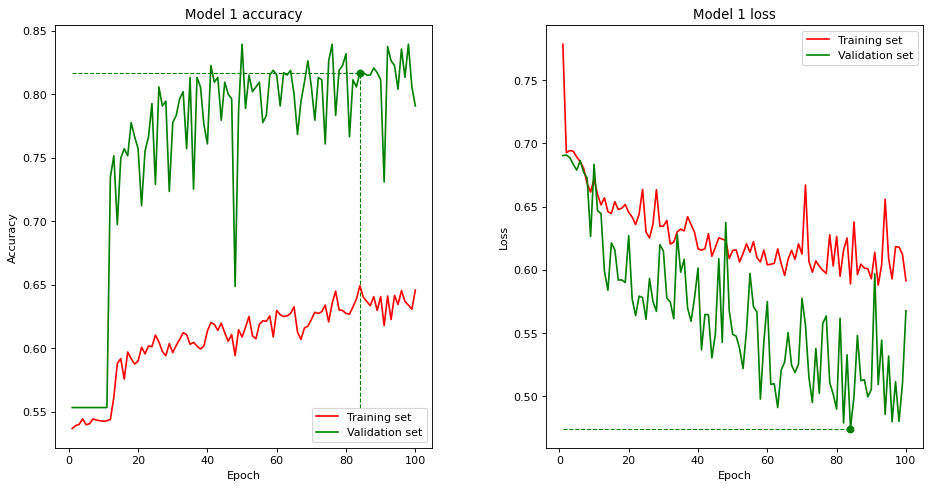

In [16]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 1 accuracy
axs[0].set_title('Model 1 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_1, tra_acc_1, 'r', label='Training set')
axs[0].plot(epochs_1, val_acc_1, 'g', label='Validation set')
axs[0].plot(opt_epoch_1, val_acc_1[opt_epoch_1-1], 'go')
axs[0].vlines(opt_epoch_1, min(val_acc_1), opt_val_acc_1, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_1, 1, opt_epoch_1, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 1 loss
axs[1].set_title('Model 1 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_1, tra_loss_1, 'r', label='Training set')
axs[1].plot(epochs_1, val_loss_1, 'g', label='Validation set')
axs[1].plot(opt_epoch_1, val_loss_1[opt_epoch_1-1], 'go')
axs[1].vlines(opt_epoch_1, min(val_loss_1), opt_val_loss_1, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_1, 1, opt_epoch_1, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 2

In [17]:
# Create a generator for training images
train_datagen = ImageDataGenerator(
    validation_split=0.2,
    rotation_range=180,
    shear_range=10,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='reflect'
)

# Fit the generator with some images
train_datagen.fit(train_images)

# Split train images into actual training and validation
train_generator = train_datagen.flow(train_images, train_labels, batch_size=32, subset='training')
validation_generator = train_datagen.flow(train_images, train_labels, batch_size=32, subset='validation')

In [18]:
# Model 2

model_2 = models.Sequential()
model_2.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Flatten())
model_2.add(layers.Dense(16, activation='relu'))
model_2.add(layers.Dropout(0.5))
model_2.add(layers.Dense(1, activation='sigmoid'))

model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 82944)             0         
                                                                 
 dense_4 (Dense)             (None, 16)               

In [19]:
# Callback for checkpointing
checkpoint = ModelCheckpoint('model_2_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_2.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_2 = model_2.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 32,
        epochs=100,
        validation_data=validation_generator,
        callbacks=[checkpoint],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_2.save('model_2_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_2_2cl_best.h5', os.path.join(destination_dir, 'model_2_2cl_best.h5'))
shutil.copy('model_2_2cl_end.h5', os.path.join(destination_dir, 'model_2_2cl_end.h5'))

<ipython-input-19-ab1313a9bdf2>:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_2 = model_2.fit_generator(


Epoch 1/100
66/66 [==============================] - ETA: 0s - loss: 0.7377 - accuracy: 0.5301
Epoch 1: val_loss improved from inf to 0.69075, saving model to model_2_2cl_best.h5
66/66 [==============================] - 85s 1s/step - loss: 0.7377 - accuracy: 0.5301 - val_loss: 0.6908 - val_accuracy: 0.5533
Epoch 2/100
66/66 [==============================] - ETA: 0s - loss: 0.6977 - accuracy: 0.5405
Epoch 2: val_loss improved from 0.69075 to 0.68572, saving model to model_2_2cl_best.h5
66/66 [==============================] - 58s 884ms/step - loss: 0.6977 - accuracy: 0.5405 - val_loss: 0.6857 - val_accuracy: 0.5533
Epoch 3/100
66/66 [==============================] - ETA: 0s - loss: 0.6999 - accuracy: 0.5391
Epoch 3: val_loss did not improve from 0.68572
66/66 [==============================] - 58s 884ms/step - loss: 0.6999 - accuracy: 0.5391 - val_loss: 0.6891 - val_accuracy: 0.5533
Epoch 4/100
66/66 [==============================] - ETA: 0s - loss: 0.6960 - accuracy: 0.5391
Epoch 4:

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_2_2cl_end.h5'

In [20]:
# History of accuracy and loss
tra_loss_2 = history_2.history['loss']
tra_acc_2 = history_2.history['accuracy']
val_loss_2 = history_2.history['val_loss']
val_acc_2 = history_2.history['val_accuracy']

# Total number of epochs training
epochs_2 = range(1, len(tra_acc_2)+1)
end_epoch_2 = len(tra_acc_2)

# Epoch when reached the validation loss minimum
opt_epoch_2 = val_loss_2.index(min(val_loss_2)) + 1

# Loss and accuracy on the validation set
end_val_loss_2 = val_loss_2[-1]
end_val_acc_2 = val_acc_2[-1]
opt_val_loss_2 = val_loss_2[opt_epoch_2-1]
opt_val_acc_2 = val_acc_2[opt_epoch_2-1]

# Loss and accuracy on the test set
opt_model_2 = models.load_model('model_2_2cl_best.h5')
test_loss_2, test_acc_2 = model_2.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_2, opt_test_acc_2 = opt_model_2.evaluate(test_images, test_labels, verbose=False)
opt_pred_2 = opt_model_2.predict(test_images)
pred_classes_2 = np.rint(opt_pred_2)

print("Model 2\n")

print("Epoch [end]: %d" % end_epoch_2)
print("Epoch [opt]: %d" % opt_epoch_2)
print("Valid accuracy [end]: %.4f" % end_val_acc_2)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_2)
print("Test accuracy [end]:  %.4f" % test_acc_2)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_2)
print("Valid loss [end]: %.4f" % end_val_loss_2)
print("Valid loss [opt]: %.4f" % opt_val_loss_2)
print("Test loss [end]:  %.4f" % test_loss_2)
print("Test loss [opt]:  %.4f" % opt_test_loss_2)

print(classification_report(test_labels, pred_classes_2, digits=4))

Model 2

Epoch [end]: 100
Epoch [opt]: 92
Valid accuracy [end]: 0.8542
Valid accuracy [opt]: 0.8766
Test accuracy [end]:  0.8185
Test accuracy [opt]:  0.8185
Valid loss [end]: 0.3549
Valid loss [opt]: 0.3207
Test loss [end]:  0.4722
Test loss [opt]:  0.4841
              precision    recall  f1-score   support

           0     0.8172    0.8492    0.8329       179
           1     0.8200    0.7834    0.8013       157

    accuracy                         0.8185       336
   macro avg     0.8186    0.8163    0.8171       336
weighted avg     0.8185    0.8185    0.8181       336



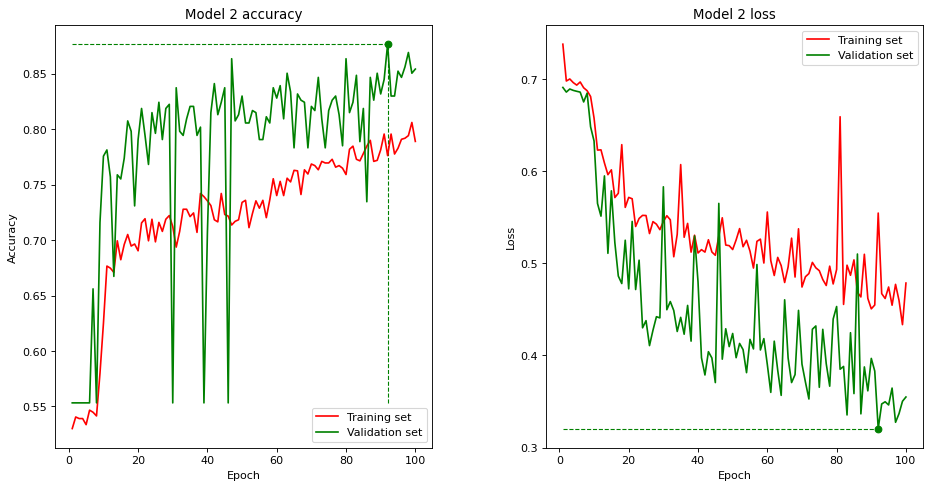

In [21]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 2 accuracy
axs[0].set_title('Model 2 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_2, tra_acc_2, 'r', label='Training set')
axs[0].plot(epochs_2, val_acc_2, 'g', label='Validation set')
axs[0].plot(opt_epoch_2, val_acc_2[opt_epoch_2-1], 'go')
axs[0].vlines(opt_epoch_2, min(val_acc_2), opt_val_acc_2, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_2, 1, opt_epoch_2, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 2 loss
axs[1].set_title('Model 2 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_2, tra_loss_2, 'r', label='Training set')
axs[1].plot(epochs_2, val_loss_2, 'g', label='Validation set')
axs[1].plot(opt_epoch_2, val_loss_2[opt_epoch_2-1], 'go')
axs[1].vlines(opt_epoch_2, min(val_loss_2), opt_val_loss_2, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_2, 1, opt_epoch_2, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 3

In [22]:
# Model 3

model_3 = models.Sequential()
model_3.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_3.add(layers.MaxPooling2D((2, 2)))
model_3.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_3.add(layers.MaxPooling2D((2, 2)))
model_3.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_3.add(layers.MaxPooling2D((2, 2)))
model_3.add(layers.Flatten())
model_3.add(layers.Dense(32, activation='relu'))
model_3.add(layers.Dropout(0.5))
model_3.add(layers.Dense(1, activation='sigmoid'))

model_3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 17, 17, 128)     

In [23]:
# Increase batch size
train_generator = train_datagen.flow(train_images, train_labels, batch_size=128, subset='training')
validation_generator = train_datagen.flow(train_images, train_labels, batch_size=128, subset='validation')

In [24]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=40, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_3_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_3.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_3 = model_3.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_3.save('model_3_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_3_2cl_best.h5', os.path.join(destination_dir, 'model_3_2cl_best.h5'))
shutil.copy('model_3_2cl_end.h5', os.path.join(destination_dir, 'model_3_2cl_end.h5'))

<ipython-input-24-b34d0d947493>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_3 = model_3.fit_generator(


Epoch 1/500
16/16 [==============================] - ETA: 0s - loss: 0.8955 - accuracy: 0.5176
Epoch 1: val_loss improved from inf to 1.29014, saving model to model_3_2cl_best.h5
16/16 [==============================] - 72s 4s/step - loss: 0.8955 - accuracy: 0.5176 - val_loss: 1.2901 - val_accuracy: 0.5533
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.7475 - accuracy: 0.5186
Epoch 2: val_loss improved from 1.29014 to 0.68972, saving model to model_3_2cl_best.h5
16/16 [==============================] - 72s 4s/step - loss: 0.7475 - accuracy: 0.5186 - val_loss: 0.6897 - val_accuracy: 0.5533
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.6899 - accuracy: 0.5524
Epoch 3: val_loss did not improve from 0.68972
16/16 [==============================] - 71s 4s/step - loss: 0.6899 - accuracy: 0.5524 - val_loss: 0.6905 - val_accuracy: 0.5533
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss: 0.6913 - accuracy: 0.5445
Epoch 4: val_l

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_3_2cl_end.h5'

In [25]:
# History of accuracy and loss
tra_loss_3 = history_3.history['loss']
tra_acc_3 = history_3.history['accuracy']
val_loss_3 = history_3.history['val_loss']
val_acc_3 = history_3.history['val_accuracy']

# Total number of epochs training
epochs_3 = range(1, len(tra_acc_3)+1)
end_epoch_3 = len(tra_acc_3)

# Epoch when reached the validation loss minimum
opt_epoch_3 = val_loss_3.index(min(val_loss_3)) + 1

# Loss and accuracy on the validation set
end_val_loss_3 = val_loss_3[-1]
end_val_acc_3 = val_acc_3[-1]
opt_val_loss_3 = val_loss_3[opt_epoch_3-1]
opt_val_acc_3 = val_acc_3[opt_epoch_3-1]

# Loss and accuracy on the test set
opt_model_3 = models.load_model('model_3_2cl_best.h5')
test_loss_3, test_acc_3 = model_3.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_3, opt_test_acc_3 = opt_model_3.evaluate(test_images, test_labels, verbose=False)
opt_pred_3 = opt_model_3.predict(test_images)
pred_classes_3 = np.rint(opt_pred_3)

print("Model 3\n")

print("Epoch [end]: %d" % end_epoch_3)
print("Epoch [opt]: %d" % opt_epoch_3)
print("Valid accuracy [end]: %.4f" % end_val_acc_3)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_3)
print("Test accuracy [end]:  %.4f" % test_acc_3)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_3)
print("Valid loss [end]: %.4f" % end_val_loss_3)
print("Valid loss [opt]: %.4f" % opt_val_loss_3)
print("Test loss [end]:  %.4f" % test_loss_3)
print("Test loss [opt]:  %.4f" % opt_test_loss_3)

print(classification_report(test_labels, pred_classes_3, digits=4))

Model 3

Epoch [end]: 256
Epoch [opt]: 216
Valid accuracy [end]: 0.9028
Valid accuracy [opt]: 0.9065
Test accuracy [end]:  0.8542
Test accuracy [opt]:  0.8750
Valid loss [end]: 0.2941
Valid loss [opt]: 0.2094
Test loss [end]:  0.3679
Test loss [opt]:  0.3389
              precision    recall  f1-score   support

           0     0.8960    0.8659    0.8807       179
           1     0.8528    0.8854    0.8688       157

    accuracy                         0.8750       336
   macro avg     0.8744    0.8756    0.8747       336
weighted avg     0.8758    0.8750    0.8751       336



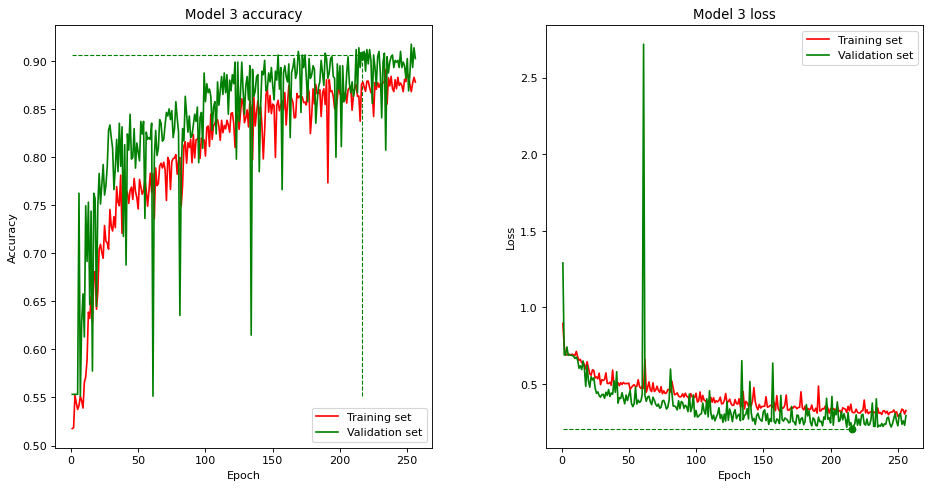

In [26]:

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 3 accuracy
axs[0].set_title('Model 3 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_3, tra_acc_3, 'r', label='Training set')
axs[0].plot(epochs_3, val_acc_3, 'g', label='Validation set')
axs[0].plot(opt_epoch_3, val_acc_3[opt_epoch_3-1], 'go')
axs[0].vlines(opt_epoch_3, min(val_acc_3), opt_val_acc_3, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_3, 1, opt_epoch_3, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 3 loss
axs[1].set_title('Model 3 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_3, tra_loss_3, 'r', label='Training set')
axs[1].plot(epochs_3, val_loss_3, 'g', label='Validation set')
axs[1].plot(opt_epoch_3, val_loss_3[opt_epoch_3-1], 'go')
axs[1].vlines(opt_epoch_3, min(val_loss_3), opt_val_loss_3, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_3, 1, opt_epoch_3, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 4

In [27]:
# Model 4

model_4 = models.Sequential()
model_4.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_4.add(layers.MaxPooling2D((2, 2)))
model_4.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_4.add(layers.MaxPooling2D((2, 2)))
model_4.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_4.add(layers.MaxPooling2D((2, 2)))
model_4.add(layers.Flatten())
model_4.add(layers.Dense(48, activation='relu'))
model_4.add(layers.Dropout(0.5))
model_4.add(layers.Dense(1, activation='sigmoid'))

model_4.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 17, 17, 128)     

In [28]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=80, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_4_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_4.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_4 = model_4.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_4.save('model_4_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_4_2cl_best.h5', os.path.join(destination_dir, 'model_4_2cl_best.h5'))
shutil.copy('model_4_2cl_end.h5', os.path.join(destination_dir, 'model_4_2cl_end.h5'))

<ipython-input-28-2b8358de2f57>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_4 = model_4.fit_generator(


Epoch 1/500
16/16 [==============================] - ETA: 0s - loss: 0.7524 - accuracy: 0.5310
Epoch 1: val_loss improved from inf to 0.69341, saving model to model_4_2cl_best.h5
16/16 [==============================] - 84s 5s/step - loss: 0.7524 - accuracy: 0.5310 - val_loss: 0.6934 - val_accuracy: 0.4579
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.6979 - accuracy: 0.5231
Epoch 2: val_loss improved from 0.69341 to 0.69007, saving model to model_4_2cl_best.h5
16/16 [==============================] - 80s 5s/step - loss: 0.6979 - accuracy: 0.5231 - val_loss: 0.6901 - val_accuracy: 0.5533
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.6914 - accuracy: 0.5271
Epoch 3: val_loss improved from 0.69007 to 0.68553, saving model to model_4_2cl_best.h5
16/16 [==============================] - 80s 5s/step - loss: 0.6914 - accuracy: 0.5271 - val_loss: 0.6855 - val_accuracy: 0.5533
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss:

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_4_2cl_end.h5'

In [29]:
# History of accuracy and loss
tra_loss_4 = history_4.history['loss']
tra_acc_4 = history_4.history['accuracy']
val_loss_4 = history_4.history['val_loss']
val_acc_4 = history_4.history['val_accuracy']

# Total number of epochs training
epochs_4 = range(1, len(tra_acc_4)+1)
end_epoch_4 = len(tra_acc_4)

# Epoch when reached the validation loss minimum
opt_epoch_4 = val_loss_4.index(min(val_loss_4)) + 1

# Loss and accuracy on the validation set
end_val_loss_4 = val_loss_4[-1]
end_val_acc_4 = val_acc_4[-1]
opt_val_loss_4 = val_loss_4[opt_epoch_4-1]
opt_val_acc_4 = val_acc_4[opt_epoch_4-1]

# Loss and accuracy on the test set
opt_model_4 = models.load_model('model_4_2cl_best.h5')
test_loss_4, test_acc_4 = model_4.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_4, opt_test_acc_4 = opt_model_4.evaluate(test_images, test_labels, verbose=False)
opt_pred_4 = opt_model_4.predict(test_images)
pred_classes_4 = np.rint(opt_pred_4)

print("Model 4\n")

print("Epoch [end]: %d" % end_epoch_4)
print("Epoch [opt]: %d" % opt_epoch_4)
print("Valid accuracy [end]: %.4f" % end_val_acc_4)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_4)
print("Test accuracy [end]:  %.4f" % test_acc_4)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_4)
print("Valid loss [end]: %.4f" % end_val_loss_4)
print("Valid loss [opt]: %.4f" % opt_val_loss_4)
print("Test loss [end]:  %.4f" % test_loss_4)
print("Test loss [opt]:  %.4f" % opt_test_loss_4)

print(classification_report(test_labels, pred_classes_4, digits=4))

Model 4

Epoch [end]: 349
Epoch [opt]: 269
Valid accuracy [end]: 0.8916
Valid accuracy [opt]: 0.9196
Test accuracy [end]:  0.8690
Test accuracy [opt]:  0.8720
Valid loss [end]: 0.2626
Valid loss [opt]: 0.1962
Test loss [end]:  0.3604
Test loss [opt]:  0.3527
              precision    recall  f1-score   support

           0     0.8617    0.9050    0.8828       179
           1     0.8851    0.8344    0.8590       157

    accuracy                         0.8720       336
   macro avg     0.8734    0.8697    0.8709       336
weighted avg     0.8727    0.8720    0.8717       336



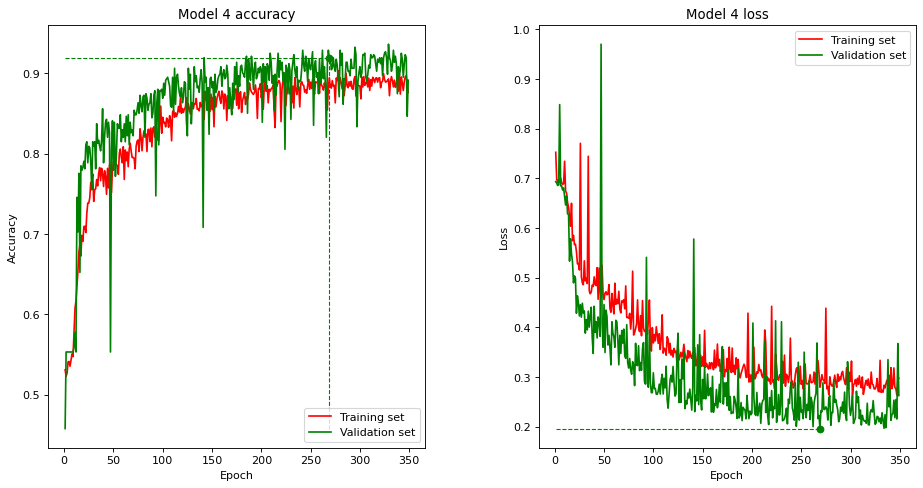

In [30]:

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 4 accuracy
axs[0].set_title('Model 4 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_4, tra_acc_4, 'r', label='Training set')
axs[0].plot(epochs_4, val_acc_4, 'g', label='Validation set')
axs[0].plot(opt_epoch_4, val_acc_4[opt_epoch_4-1], 'go')
axs[0].vlines(opt_epoch_4, min(val_acc_4), opt_val_acc_4, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_4, 1, opt_epoch_4, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 4 loss
axs[1].set_title('Model 4 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_4, tra_loss_4, 'r', label='Training set')
axs[1].plot(epochs_4, val_loss_4, 'g', label='Validation set')
axs[1].plot(opt_epoch_4, val_loss_4[opt_epoch_4-1], 'go')
axs[1].vlines(opt_epoch_4, min(val_loss_4), opt_val_loss_4, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_4, 1, opt_epoch_4, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 5

In [31]:
# Model 5

model_5 = models.Sequential()
model_5.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_5.add(layers.MaxPooling2D((2, 2)))
model_5.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_5.add(layers.MaxPooling2D((2, 2)))
model_5.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_5.add(layers.MaxPooling2D((2, 2)))
model_5.add(layers.Flatten())
model_5.add(layers.Dense(48, activation='relu'))
model_5.add(layers.Dropout(0.5))
model_5.add(layers.Dense(1, activation='sigmoid'))

model_5.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 17, 17, 128)     

In [32]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=80, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_5_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_5.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_5 = model_5.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_5.save('model_5_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_5_2cl_best.h5', os.path.join(destination_dir, 'model_5_2cl_best.h5'))
shutil.copy('model_5_2cl_end.h5', os.path.join(destination_dir, 'model_5_2cl_end.h5'))

<ipython-input-32-7d8a54f107f8>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_5 = model_5.fit_generator(


Epoch 1/500
16/16 [==============================] - ETA: 0s - loss: 0.9804 - accuracy: 0.5147
Epoch 1: val_loss improved from inf to 0.68888, saving model to model_5_2cl_best.h5
16/16 [==============================] - 73s 4s/step - loss: 0.9804 - accuracy: 0.5147 - val_loss: 0.6889 - val_accuracy: 0.5533
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.6914 - accuracy: 0.5415
Epoch 2: val_loss improved from 0.68888 to 0.68726, saving model to model_5_2cl_best.h5
16/16 [==============================] - 70s 4s/step - loss: 0.6914 - accuracy: 0.5415 - val_loss: 0.6873 - val_accuracy: 0.5533
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.6950 - accuracy: 0.5340
Epoch 3: val_loss improved from 0.68726 to 0.68282, saving model to model_5_2cl_best.h5
16/16 [==============================] - 71s 4s/step - loss: 0.6950 - accuracy: 0.5340 - val_loss: 0.6828 - val_accuracy: 0.5533
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss:

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_5_2cl_end.h5'

In [33]:
# History of accuracy and loss
tra_loss_5 = history_5.history['loss']
tra_acc_5 = history_5.history['accuracy']
val_loss_5 = history_5.history['val_loss']
val_acc_5 = history_5.history['val_accuracy']

# Total number of epochs training
epochs_5 = range(1, len(tra_acc_5)+1)
end_epoch_5 = len(tra_acc_5)

# Epoch when reached the validation loss minimum
opt_epoch_5 = val_loss_5.index(min(val_loss_5)) + 1

# Loss and accuracy on the validation set
end_val_loss_5 = val_loss_5[-1]
end_val_acc_5 = val_acc_5[-1]
opt_val_loss_5 = val_loss_5[opt_epoch_5-1]
opt_val_acc_5 = val_acc_5[opt_epoch_5-1]

# Loss and accuracy on the test set
opt_model_5 = models.load_model('model_5_2cl_best.h5')
test_loss_5, test_acc_5 = model_5.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_5, opt_test_acc_5 = opt_model_5.evaluate(test_images, test_labels, verbose=False)
opt_pred_5 = opt_model_5.predict(test_images)
pred_classes_5 = np.rint(opt_pred_5)

print("Model 5\n")

print("Epoch [end]: %d" % end_epoch_5)
print("Epoch [opt]: %d" % opt_epoch_5)
print("Valid accuracy [end]: %.4f" % end_val_acc_5)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_5)
print("Test accuracy [end]:  %.4f" % test_acc_5)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_5)
print("Valid loss [end]: %.4f" % end_val_loss_5)
print("Valid loss [opt]: %.4f" % opt_val_loss_5)
print("Test loss [end]:  %.4f" % test_loss_5)
print("Test loss [opt]:  %.4f" % opt_test_loss_5)

print(classification_report(test_labels, pred_classes_5, digits=4))

Model 5

Epoch [end]: 500
Epoch [opt]: 478
Valid accuracy [end]: 0.9009
Valid accuracy [opt]: 0.9159
Test accuracy [end]:  0.8720
Test accuracy [opt]:  0.8601
Valid loss [end]: 0.2187
Valid loss [opt]: 0.1909
Test loss [end]:  0.3301
Test loss [opt]:  0.3381
              precision    recall  f1-score   support

           0     0.8474    0.8994    0.8726       179
           1     0.8767    0.8153    0.8449       157

    accuracy                         0.8601       336
   macro avg     0.8620    0.8574    0.8588       336
weighted avg     0.8611    0.8601    0.8597       336



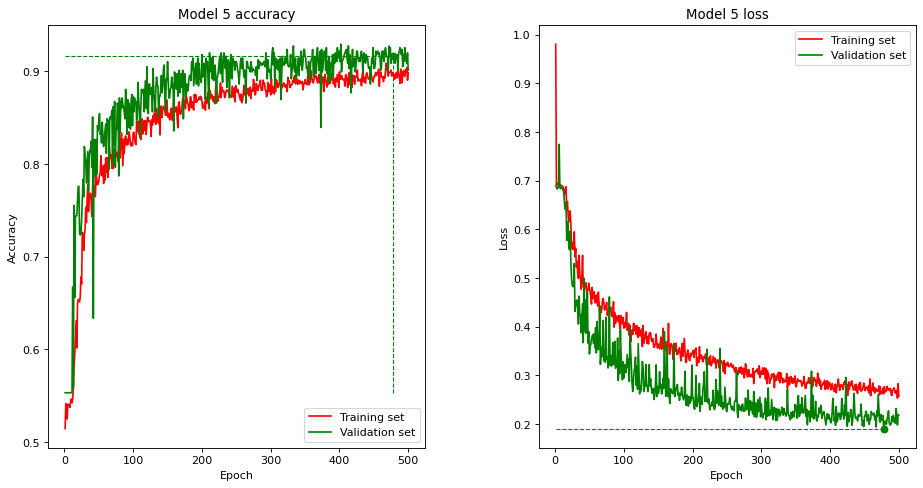

In [34]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 5 accuracy
axs[0].set_title('Model 5 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_5, tra_acc_5, 'r', label='Training set')
axs[0].plot(epochs_5, val_acc_5, 'g', label='Validation set')
axs[0].plot(opt_epoch_5, val_acc_5[opt_epoch_5-1], 'go')
axs[0].vlines(opt_epoch_5, min(val_acc_5), opt_val_acc_5, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_5, 1, opt_epoch_5, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 5 loss
axs[1].set_title('Model 5 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_5, tra_loss_5, 'r', label='Training set')
axs[1].plot(epochs_5, val_loss_5, 'g', label='Validation set')
axs[1].plot(opt_epoch_5, val_loss_5[opt_epoch_5-1], 'go')
axs[1].vlines(opt_epoch_5, min(val_loss_5), opt_val_loss_5, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_5, 1, opt_epoch_5, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()

## Experiment 6

In [10]:
# Model 6

model_6 = models.Sequential()
model_6.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))
model_6.add(layers.MaxPooling2D((2, 2)))
model_6.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_6.add(layers.MaxPooling2D((2, 2)))
model_6.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_6.add(layers.MaxPooling2D((2, 2)))
model_6.add(layers.Conv2D(256, (3, 3), activation='relu'))
model_6.add(layers.MaxPooling2D((2, 2)))
model_6.add(layers.Flatten())
model_6.add(layers.Dense(48, activation='relu'))
model_6.add(layers.Dropout(0.5))
model_6.add(layers.Dense(1, activation='sigmoid'))

model_6.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [12]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=80, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_6_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_6.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_6 = model_6.fit_generator(
        train_generator,
        steps_per_epoch=n_train_img // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_6.save('model_6_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_6_2cl_best.h5', os.path.join(destination_dir, 'model_6_2cl_best.h5'))
shutil.copy('model_6_2cl_end.h5', os.path.join(destination_dir, 'model_6_2cl_end.h5'))

Epoch 1/500


<ipython-input-12-4e3796a8d5d6>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_6 = model_6.fit_generator(


20/20 [==============================] - ETA: 0s - loss: 0.6171 - accuracy: 0.8125
Epoch 1: val_loss improved from inf to 0.44735, saving model to model_6_2cl_best.h5
20/20 [==============================] - 36s 2s/step - loss: 0.6171 - accuracy: 0.8125 - val_loss: 0.4474 - val_accuracy: 0.8393
Epoch 2/500
20/20 [==============================] - ETA: 0s - loss: 0.3355 - accuracy: 0.8766
Epoch 2: val_loss improved from 0.44735 to 0.41498, saving model to model_6_2cl_best.h5
20/20 [==============================] - 36s 2s/step - loss: 0.3355 - accuracy: 0.8766 - val_loss: 0.4150 - val_accuracy: 0.8636
Epoch 3/500
20/20 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.8859
Epoch 3: val_loss did not improve from 0.41498
20/20 [==============================] - 39s 2s/step - loss: 0.2685 - accuracy: 0.8859 - val_loss: 0.4267 - val_accuracy: 0.8710
Epoch 4/500
20/20 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.8870
Epoch 4: val_loss did not 

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_6_2cl_end.h5'

In [13]:
# History of accuracy and loss
tra_loss_6 = history_6.history['loss']
tra_acc_6 = history_6.history['accuracy']
val_loss_6 = history_6.history['val_loss']
val_acc_6 = history_6.history['val_accuracy']

# Total number of epochs training
epochs_6 = range(1, len(tra_acc_6)+1)
end_epoch_6 = len(tra_acc_6)

# Epoch when reached the validation loss minimum
opt_epoch_6 = val_loss_6.index(min(val_loss_6)) + 1

# Loss and accuracy on the validation set
end_val_loss_6 = val_loss_6[-1]
end_val_acc_6 = val_acc_6[-1]
opt_val_loss_6 = val_loss_6[opt_epoch_6-1]
opt_val_acc_6 = val_acc_6[opt_epoch_6-1]

# Loss and accuracy on the test set
opt_model_6 = models.load_model('model_6_2cl_best.h5')
test_loss_6, test_acc_6 = model_6.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_6, opt_test_acc_6 = opt_model_6.evaluate(test_images, test_labels, verbose=False)
opt_pred_6 = opt_model_6.predict(test_images)
pred_classes_6 = np.rint(opt_pred_6)

print("Model 6\n")

print("Epoch [end]: %d" % end_epoch_6)
print("Epoch [opt]: %d" % opt_epoch_6)
print("Valid accuracy [end]: %.4f" % end_val_acc_6)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_6)
print("Test accuracy [end]:  %.4f" % test_acc_6)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_6)
print("Valid loss [end]: %.4f" % end_val_loss_6)
print("Valid loss [opt]: %.4f" % opt_val_loss_6)
print("Test loss [end]:  %.4f" % test_loss_6)
print("Test loss [opt]:  %.4f" % opt_test_loss_6)

print(classification_report(test_labels, pred_classes_6, digits=4))

Model 6

Epoch [end]: 82
Epoch [opt]: 2
Valid accuracy [end]: 0.8748
Valid accuracy [opt]: 0.8636
Test accuracy [end]:  0.8512
Test accuracy [opt]:  0.8304
Valid loss [end]: 0.7167
Valid loss [opt]: 0.4150
Test loss [end]:  0.6784
Test loss [opt]:  0.4271
              precision    recall  f1-score   support

           0     0.8466    0.8324    0.8394       179
           1     0.8125    0.8280    0.8202       157

    accuracy                         0.8304       336
   macro avg     0.8295    0.8302    0.8298       336
weighted avg     0.8307    0.8304    0.8304       336



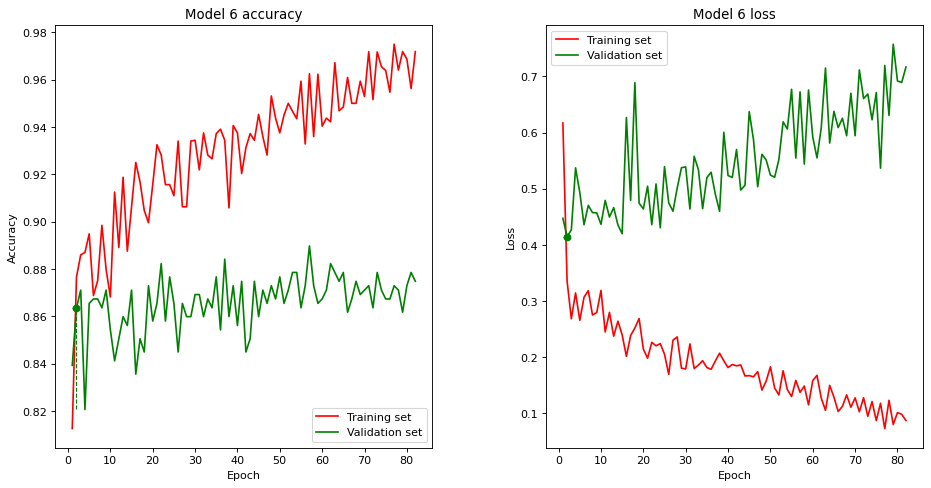

In [14]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 6 accuracy
axs[0].set_title('Model 6 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_6, tra_acc_6, 'r', label='Training set')
axs[0].plot(epochs_6, val_acc_6, 'g', label='Validation set')
axs[0].plot(opt_epoch_6, val_acc_6[opt_epoch_6-1], 'go')
axs[0].vlines(opt_epoch_6, min(val_acc_6), opt_val_acc_6, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_6, 1, opt_epoch_6, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 6 loss
axs[1].set_title('Model 6 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_6, tra_loss_6, 'r', label='Training set')
axs[1].plot(epochs_6, val_loss_6, 'g', label='Validation set')
axs[1].plot(opt_epoch_6, val_loss_6[opt_epoch_6-1], 'go')
axs[1].vlines(opt_epoch_6, min(val_loss_6), opt_val_loss_6, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_6, 1, opt_epoch_6, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 7

In [15]:
# Model 7

model_7 = models.Sequential()
model_7.add(layers.Conv2D(32, (5, 5), strides=(2, 2), activation='relu', input_shape=(150, 150, 1)))
model_7.add(layers.MaxPooling2D((2, 2)))
model_7.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_7.add(layers.MaxPooling2D((2, 2)))
model_7.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_7.add(layers.MaxPooling2D((2, 2)))
model_7.add(layers.Flatten())
model_7.add(layers.Dense(48, activation='relu'))
model_7.add(layers.Dropout(0.5))
model_7.add(layers.Dense(1, activation='sigmoid'))

model_7.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 73, 73, 32)        832       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 17, 17, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 15, 15, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 7, 7, 128)       

In [16]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=80, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_7_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_7.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_7 = model_7.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_7.save('model_7_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_7_2cl_best.h5', os.path.join(destination_dir, 'model_7_2cl_best.h5'))
shutil.copy('model_7_2cl_end.h5', os.path.join(destination_dir, 'model_7_2cl_end.h5'))

Epoch 1/500


<ipython-input-16-49552c696d7a>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_7 = model_7.fit_generator(


16/16 [==============================] - ETA: 0s - loss: 0.7192 - accuracy: 0.5430
Epoch 1: val_loss improved from inf to 0.68983, saving model to model_7_2cl_best.h5
16/16 [==============================] - 8s 427ms/step - loss: 0.7192 - accuracy: 0.5430 - val_loss: 0.6898 - val_accuracy: 0.5495
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.6944 - accuracy: 0.5527
Epoch 2: val_loss did not improve from 0.68983
16/16 [==============================] - 6s 380ms/step - loss: 0.6944 - accuracy: 0.5527 - val_loss: 0.7091 - val_accuracy: 0.5495
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.6996 - accuracy: 0.5312
Epoch 3: val_loss did not improve from 0.68983
16/16 [==============================] - 6s 396ms/step - loss: 0.6996 - accuracy: 0.5312 - val_loss: 0.6911 - val_accuracy: 0.5477
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss: 0.7015 - accuracy: 0.5246
Epoch 4: val_loss improved from 0.68983 to 0.68185, saving mo

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_7_2cl_end.h5'

In [17]:
# History of accuracy and loss
tra_loss_7 = history_7.history['loss']
tra_acc_7 = history_7.history['accuracy']
val_loss_7 = history_7.history['val_loss']
val_acc_7 = history_7.history['val_accuracy']

# Total number of epochs training
epochs_7 = range(1, len(tra_acc_7)+1)
end_epoch_7 = len(tra_acc_7)

# Epoch when reached the validation loss minimum
opt_epoch_7 = val_loss_7.index(min(val_loss_7)) + 1

# Loss and accuracy on the validation set
end_val_loss_7 = val_loss_7[-1]
end_val_acc_7 = val_acc_7[-1]
opt_val_loss_7 = val_loss_7[opt_epoch_7-1]
opt_val_acc_7 = val_acc_7[opt_epoch_7-1]

# Loss and accuracy on the test set
opt_model_7 = models.load_model('model_7_2cl_best.h5')
test_loss_7, test_acc_7 = model_7.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_7, opt_test_acc_7 = opt_model_7.evaluate(test_images, test_labels, verbose=False)
opt_pred_7 = opt_model_7.predict(test_images)
pred_classes_7 = np.rint(opt_pred_7)

print("Model 7\n")

print("Epoch [end]: %d" % end_epoch_7)
print("Epoch [opt]: %d" % opt_epoch_7)
print("Valid accuracy [end]: %.4f" % end_val_acc_7)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_7)
print("Test accuracy [end]:  %.4f" % test_acc_7)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_7)
print("Valid loss [end]: %.4f" % end_val_loss_7)
print("Valid loss [opt]: %.4f" % opt_val_loss_7)
print("Test loss [end]:  %.4f" % test_loss_7)
print("Test loss [opt]:  %.4f" % opt_test_loss_7)

print(classification_report(test_labels, pred_classes_7, digits=4))

Model 7

Epoch [end]: 207
Epoch [opt]: 127
Valid accuracy [end]: 0.8748
Valid accuracy [opt]: 0.8579
Test accuracy [end]:  0.8244
Test accuracy [opt]:  0.8214
Valid loss [end]: 0.4017
Valid loss [opt]: 0.3612
Test loss [end]:  0.4967
Test loss [opt]:  0.4367
              precision    recall  f1-score   support

           0     0.8216    0.8492    0.8352       179
           1     0.8212    0.7898    0.8052       157

    accuracy                         0.8214       336
   macro avg     0.8214    0.8195    0.8202       336
weighted avg     0.8214    0.8214    0.8212       336



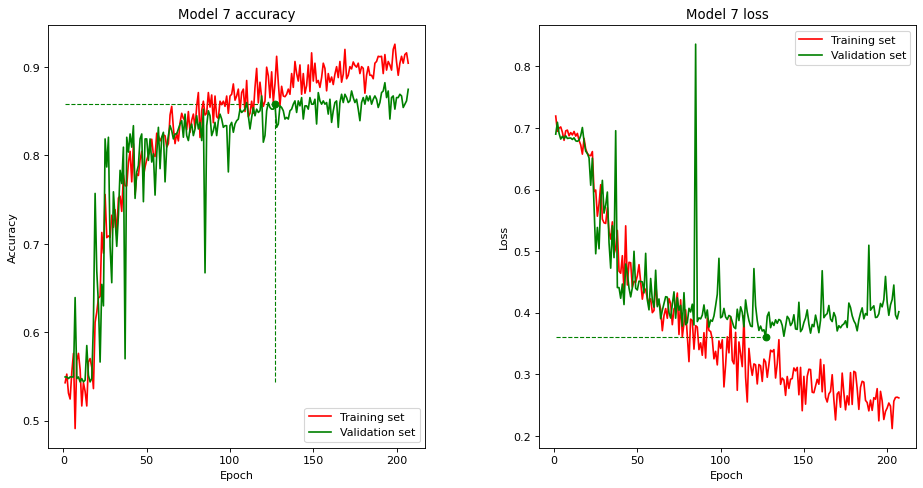

In [18]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 7 accuracy
axs[0].set_title('Model 7 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_7, tra_acc_7, 'r', label='Training set')
axs[0].plot(epochs_7, val_acc_7, 'g', label='Validation set')
axs[0].plot(opt_epoch_7, val_acc_7[opt_epoch_7-1], 'go')
axs[0].vlines(opt_epoch_7, min(val_acc_7), opt_val_acc_7, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_7, 1, opt_epoch_7, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 7 loss
axs[1].set_title('Model 7 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_7, tra_loss_7, 'r', label='Training set')
axs[1].plot(epochs_7, val_loss_7, 'g', label='Validation set')
axs[1].plot(opt_epoch_7, val_loss_7[opt_epoch_7-1], 'go')
axs[1].vlines(opt_epoch_7, min(val_loss_7), opt_val_loss_7, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_7, 1, opt_epoch_7, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 8

In [19]:
# Model 8

model_8 = models.Sequential()
model_8.add(layers.Conv2D(32, (3, 3), activation='relu',  input_shape=(150, 150, 1)))
model_8.add(layers.MaxPooling2D((2, 2)))
model_8.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_8.add(layers.MaxPooling2D((2, 2)))
model_8.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_8.add(layers.MaxPooling2D((2, 2)))
model_8.add(layers.Flatten())
model_8.add(layers.Dense(48, activation='relu'))
model_8.add(layers.Dropout(0.5))
model_8.add(layers.Dense(1, activation='sigmoid'))

model_8.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 17, 17, 128)     

In [20]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=60, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_8_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_8.compile(optimizer=Adam(learning_rate=1e-4, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_8 = model_8.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_8.save('model_8_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_8_2cl_best.h5', os.path.join(destination_dir, 'model_8_2cl_best.h5'))
shutil.copy('model_8_2cl_end.h5', os.path.join(destination_dir, 'model_8_2cl_end.h5'))

Epoch 1/500


<ipython-input-20-c3ff89784558>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_8 = model_8.fit_generator(


16/16 [==============================] - ETA: 0s - loss: 0.7062 - accuracy: 0.4785
Epoch 1: val_loss improved from inf to 0.69620, saving model to model_8_2cl_best.h5
16/16 [==============================] - 26s 2s/step - loss: 0.7062 - accuracy: 0.4785 - val_loss: 0.6962 - val_accuracy: 0.4505
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.6951 - accuracy: 0.5137
Epoch 2: val_loss improved from 0.69620 to 0.68891, saving model to model_8_2cl_best.h5
16/16 [==============================] - 24s 1s/step - loss: 0.6951 - accuracy: 0.5137 - val_loss: 0.6889 - val_accuracy: 0.5495
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.6924 - accuracy: 0.5371
Epoch 3: val_loss improved from 0.68891 to 0.68883, saving model to model_8_2cl_best.h5
16/16 [==============================] - 24s 2s/step - loss: 0.6924 - accuracy: 0.5371 - val_loss: 0.6888 - val_accuracy: 0.5495
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss: 0.6937 - ac

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_8_2cl_end.h5'

In [21]:
# History of accuracy and loss
tra_loss_8 = history_8.history['loss']
tra_acc_8 = history_8.history['accuracy']
val_loss_8 = history_8.history['val_loss']
val_acc_8 = history_8.history['val_accuracy']

# Total number of epochs training
epochs_8 = range(1, len(tra_acc_8)+1)
end_epoch_8 = len(tra_acc_8)

# Epoch when reached the validation loss minimum
opt_epoch_8 = val_loss_8.index(min(val_loss_8)) + 1

# Loss and accuracy on the validation set
end_val_loss_8 = val_loss_8[-1]
end_val_acc_8 = val_acc_8[-1]
opt_val_loss_8 = val_loss_8[opt_epoch_8-1]
opt_val_acc_8 = val_acc_8[opt_epoch_8-1]

# Loss and accuracy on the test set
opt_model_8 = models.load_model('model_8_2cl_best.h5')
test_loss_8, test_acc_8 = model_8.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_8, opt_test_acc_8 = opt_model_8.evaluate(test_images, test_labels, verbose=False)
opt_pred_8 = opt_model_8.predict(test_images)
pred_classes_8 = np.rint(opt_pred_8)

print("Model 8\n")

print("Epoch [end]: %d" % end_epoch_8)
print("Epoch [opt]: %d" % opt_epoch_8)
print("Valid accuracy [end]: %.4f" % end_val_acc_8)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_8)
print("Test accuracy [end]:  %.4f" % test_acc_8)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_8)
print("Valid loss [end]: %.4f" % end_val_loss_8)
print("Valid loss [opt]: %.4f" % opt_val_loss_8)
print("Test loss [end]:  %.4f" % test_loss_8)
print("Test loss [opt]:  %.4f" % opt_test_loss_8)

print(classification_report(test_labels, pred_classes_8, digits=4))

Model 8

Epoch [end]: 500
Epoch [opt]: 454
Valid accuracy [end]: 0.8598
Valid accuracy [opt]: 0.8654
Test accuracy [end]:  0.8006
Test accuracy [opt]:  0.8006
Valid loss [end]: 0.3250
Valid loss [opt]: 0.3181
Test loss [end]:  0.4329
Test loss [opt]:  0.4281
              precision    recall  f1-score   support

           0     0.8146    0.8101    0.8123       179
           1     0.7848    0.7898    0.7873       157

    accuracy                         0.8006       336
   macro avg     0.7997    0.7999    0.7998       336
weighted avg     0.8007    0.8006    0.8006       336



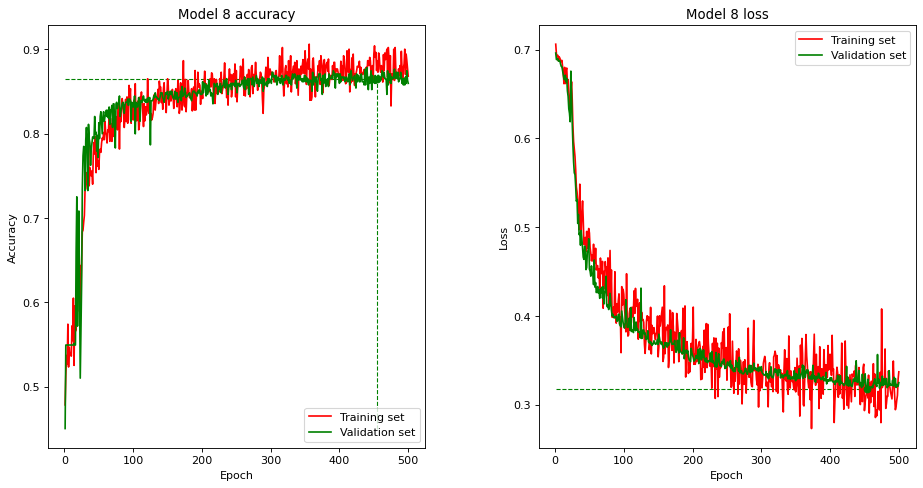

In [22]:

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 8 accuracy
axs[0].set_title('Model 8 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_8, tra_acc_8, 'r', label='Training set')
axs[0].plot(epochs_8, val_acc_8, 'g', label='Validation set')
axs[0].plot(opt_epoch_8, val_acc_8[opt_epoch_8-1], 'go')
axs[0].vlines(opt_epoch_8, min(val_acc_8), opt_val_acc_8, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_8, 1, opt_epoch_8, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 8 loss
axs[1].set_title('Model 8 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_8, tra_loss_8, 'r', label='Training set')
axs[1].plot(epochs_8, val_loss_8, 'g', label='Validation set')
axs[1].plot(opt_epoch_8, val_loss_8[opt_epoch_8-1], 'go')
axs[1].vlines(opt_epoch_8, min(val_loss_8), opt_val_loss_8, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_8, 1, opt_epoch_8, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()


## Experiment 9

In [23]:
# Model 9

model_9 = models.Sequential()
model_9.add(layers.Conv2D(32, (3, 3), activation='relu',  input_shape=(150, 150, 1), kernel_regularizer=l2(0.00005)))
model_9.add(layers.MaxPooling2D((2, 2)))
model_9.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.00005)))
model_9.add(layers.MaxPooling2D((2, 2)))
model_9.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.00005)))
model_9.add(layers.MaxPooling2D((2, 2)))
model_9.add(layers.Conv2D(256, (3, 3), activation='relu', kernel_regularizer=l2(0.00005)))
model_9.add(layers.MaxPooling2D((2, 2)))
model_9.add(layers.Flatten())
model_9.add(layers.Dense(48, activation='relu'))
model_9.add(layers.Dropout(0.5))
model_9.add(layers.Dense(1, activation='sigmoid'))

model_9.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 17, 17, 128)     

In [24]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=80, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_9_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model
model_9.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_9 = model_9.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=500,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_9.save('model_9_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_9_2cl_best.h5', os.path.join(destination_dir, 'model_9_2cl_best.h5'))
shutil.copy('model_9_2cl_end.h5', os.path.join(destination_dir, 'model_9_2cl_end.h5'))

Epoch 1/500


<ipython-input-24-2eb4a730f4e4>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_9 = model_9.fit_generator(


16/16 [==============================] - ETA: 0s - loss: 0.7060 - accuracy: 0.5352
Epoch 1: val_loss improved from inf to 0.69838, saving model to model_9_2cl_best.h5
16/16 [==============================] - 29s 2s/step - loss: 0.7060 - accuracy: 0.5352 - val_loss: 0.6984 - val_accuracy: 0.5495
Epoch 2/500
16/16 [==============================] - ETA: 0s - loss: 0.6907 - accuracy: 0.5605
Epoch 2: val_loss did not improve from 0.69838
16/16 [==============================] - 27s 2s/step - loss: 0.6907 - accuracy: 0.5605 - val_loss: 0.8719 - val_accuracy: 0.5495
Epoch 3/500
16/16 [==============================] - ETA: 0s - loss: 0.7089 - accuracy: 0.5508
Epoch 3: val_loss improved from 0.69838 to 0.69319, saving model to model_9_2cl_best.h5
16/16 [==============================] - 28s 2s/step - loss: 0.7089 - accuracy: 0.5508 - val_loss: 0.6932 - val_accuracy: 0.5495
Epoch 4/500
16/16 [==============================] - ETA: 0s - loss: 0.6939 - accuracy: 0.5540
Epoch 4: val_loss improved

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_9_2cl_end.h5'

In [25]:
# History of accuracy and loss
tra_loss_9 = history_9.history['loss']
tra_acc_9 = history_9.history['accuracy']
val_loss_9 = history_9.history['val_loss']
val_acc_9 = history_9.history['val_accuracy']

# Total number of epochs training
epochs_9 = range(1, len(tra_acc_9)+1)
end_epoch_9 = len(tra_acc_9)

# Epoch when reached the validation loss minimum
opt_epoch_9 = val_loss_9.index(min(val_loss_9)) + 1

# Loss and accuracy on the validation set
end_val_loss_9 = val_loss_9[-1]
end_val_acc_9 = val_acc_9[-1]
opt_val_loss_9 = val_loss_9[opt_epoch_9-1]
opt_val_acc_9 = val_acc_9[opt_epoch_9-1]

# Loss and accuracy on the test set
opt_model_9 = models.load_model('model_9_2cl_best.h5')
test_loss_9, test_acc_9 = model_9.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_9, opt_test_acc_9 = opt_model_9.evaluate(test_images, test_labels, verbose=False)
opt_pred_9 = opt_model_9.predict(test_images)
pred_classes_9 = np.rint(opt_pred_9)

print("Model 9\n")

print("Epoch [end]: %d" % end_epoch_9)
print("Epoch [opt]: %d" % opt_epoch_9)
print("Valid accuracy [end]: %.4f" % end_val_acc_9)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_9)
print("Test accuracy [end]:  %.4f" % test_acc_9)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_9)
print("Valid loss [end]: %.4f" % end_val_loss_9)
print("Valid loss [opt]: %.4f" % opt_val_loss_9)
print("Test loss [end]:  %.4f" % test_loss_9)
print("Test loss [opt]:  %.4f" % opt_test_loss_9)

print(classification_report(test_labels, pred_classes_9, digits=4))

Model 9

Epoch [end]: 463
Epoch [opt]: 383
Valid accuracy [end]: 0.8654
Valid accuracy [opt]: 0.8822
Test accuracy [end]:  0.8661
Test accuracy [opt]:  0.8601
Valid loss [end]: 0.3629
Valid loss [opt]: 0.3326
Test loss [end]:  0.3682
Test loss [opt]:  0.3359
              precision    recall  f1-score   support

           0     0.8511    0.8939    0.8719       179
           1     0.8716    0.8217    0.8459       157

    accuracy                         0.8601       336
   macro avg     0.8613    0.8578    0.8589       336
weighted avg     0.8607    0.8601    0.8598       336



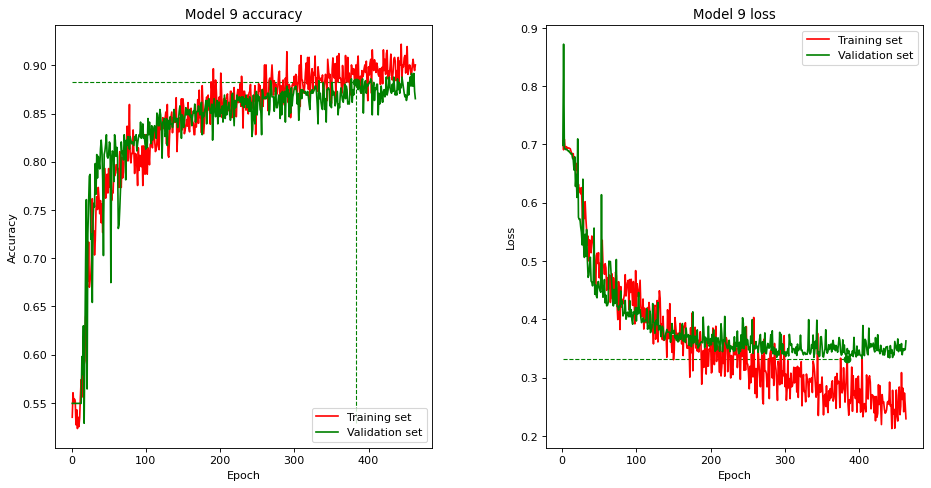

In [26]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 9 accuracy
axs[0].set_title('Model 9 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_9, tra_acc_9, 'r', label='Training set')
axs[0].plot(epochs_9, val_acc_9, 'g', label='Validation set')
axs[0].plot(opt_epoch_9, val_acc_9[opt_epoch_9-1], 'go')
axs[0].vlines(opt_epoch_9, min(val_acc_9), opt_val_acc_9, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_9, 1, opt_epoch_9, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 9 loss
axs[1].set_title('Model 9 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_9, tra_loss_9, 'r', label='Training set')
axs[1].plot(epochs_9, val_loss_9, 'g', label='Validation set')
axs[1].plot(opt_epoch_9, val_loss_9[opt_epoch_9-1], 'go')
axs[1].vlines(opt_epoch_9, min(val_loss_9), opt_val_loss_9, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_9, 1, opt_epoch_9, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()

## Experiment 10

In [27]:
# Model 10

model_10 = models.Sequential()
model_10.add(layers.Conv2D(32, (3, 3), input_shape=(150, 150, 1)))
model_10.add(layers.BatchNormalization())
model_10.add(layers.Activation("relu"))
model_10.add(layers.MaxPooling2D((2, 2)))
model_10.add(layers.Conv2D(64, (3, 3)))
model_10.add(layers.BatchNormalization())
model_10.add(layers.Activation("relu"))
model_10.add(layers.MaxPooling2D((2, 2)))
model_10.add(layers.Conv2D(128, (3, 3)))
model_10.add(layers.BatchNormalization())
model_10.add(layers.Activation("relu"))
model_10.add(layers.MaxPooling2D((2, 2)))
model_10.add(layers.Conv2D(256, (3, 3)))
model_10.add(layers.BatchNormalization())
model_10.add(layers.Activation("relu"))
model_10.add(layers.MaxPooling2D((2, 2)))
model_10.add(layers.Flatten())
model_10.add(layers.Dense(48, activation='relu'))
model_10.add(layers.Dropout(0.5))
model_10.add(layers.Dense(1, activation='sigmoid'))

model_10.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 148, 148, 32)     128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 148, 148, 32)      0         
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 72, 72, 64)      

In [28]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=50, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_10_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_10.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_10 = model_10.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=300,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_10.save('model_10_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_10_2cl_best.h5', os.path.join(destination_dir, 'model_10_2cl_best.h5'))
shutil.copy('model_10_2cl_end.h5', os.path.join(destination_dir, 'model_10_2cl_end.h5'))

Epoch 1/300


<ipython-input-28-d30d3613ec94>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_10 = model_10.fit_generator(


16/16 [==============================] - ETA: 0s - loss: 2.7166 - accuracy: 0.5156
Epoch 1: val_loss improved from inf to 0.69258, saving model to model_10_2cl_best.h5
16/16 [==============================] - 39s 2s/step - loss: 2.7166 - accuracy: 0.5156 - val_loss: 0.6926 - val_accuracy: 0.5495
Epoch 2/300
16/16 [==============================] - ETA: 0s - loss: 0.6848 - accuracy: 0.5332
Epoch 2: val_loss did not improve from 0.69258
16/16 [==============================] - 36s 2s/step - loss: 0.6848 - accuracy: 0.5332 - val_loss: 0.6930 - val_accuracy: 0.5495
Epoch 3/300
16/16 [==============================] - ETA: 0s - loss: 0.7110 - accuracy: 0.5449
Epoch 3: val_loss improved from 0.69258 to 0.68976, saving model to model_10_2cl_best.h5
16/16 [==============================] - 36s 2s/step - loss: 0.7110 - accuracy: 0.5449 - val_loss: 0.6898 - val_accuracy: 0.5495
Epoch 4/300
16/16 [==============================] - ETA: 0s - loss: 0.6816 - accuracy: 0.5742
Epoch 4: val_loss did no

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_10_2cl_end.h5'

In [29]:
# History of accuracy and loss
tra_loss_10 = history_10.history['loss']
tra_acc_10 = history_10.history['accuracy']
val_loss_10 = history_10.history['val_loss']
val_acc_10 = history_10.history['val_accuracy']

# Total number of epochs training
epochs_10 = range(1, len(tra_acc_10)+1)
end_epoch_10 = len(tra_acc_10)

# Epoch when reached the validation loss minimum
opt_epoch_10 = val_loss_10.index(min(val_loss_10)) + 1

# Loss and accuracy on the validation set
end_val_loss_10 = val_loss_10[-1]
end_val_acc_10 = val_acc_10[-1]
opt_val_loss_10 = val_loss_10[opt_epoch_10-1]
opt_val_acc_10 = val_acc_10[opt_epoch_10-1]

# Loss and accuracy on the test set
opt_model_10 = models.load_model('model_10_2cl_best.h5')
test_loss_10, test_acc_10 = model_10.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_10, opt_test_acc_10 = opt_model_10.evaluate(test_images, test_labels, verbose=False)
opt_pred_10 = opt_model_10.predict(test_images)
pred_classes_10 = np.rint(opt_pred_10)

print("Model 10\n")

print("Epoch [end]: %d" % end_epoch_10)
print("Epoch [opt]: %d" % opt_epoch_10)
print("Valid accuracy [end]: %.4f" % end_val_acc_10)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_10)
print("Test accuracy [end]:  %.4f" % test_acc_10)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_10)
print("Valid loss [end]: %.4f" % end_val_loss_10)
print("Valid loss [opt]: %.4f" % opt_val_loss_10)
print("Test loss [end]:  %.4f" % test_loss_10)
print("Test loss [opt]:  %.4f" % opt_test_loss_10)

print(classification_report(test_labels, pred_classes_10, digits=4))

Model 10

Epoch [end]: 89
Epoch [opt]: 39
Valid accuracy [end]: 0.8579
Valid accuracy [opt]: 0.8579
Test accuracy [end]:  0.8363
Test accuracy [opt]:  0.8214
Valid loss [end]: 0.4160
Valid loss [opt]: 0.3557
Test loss [end]:  0.4071
Test loss [opt]:  0.4259
              precision    recall  f1-score   support

           0     0.8362    0.8268    0.8315       179
           1     0.8050    0.8153    0.8101       157

    accuracy                         0.8214       336
   macro avg     0.8206    0.8211    0.8208       336
weighted avg     0.8216    0.8214    0.8215       336



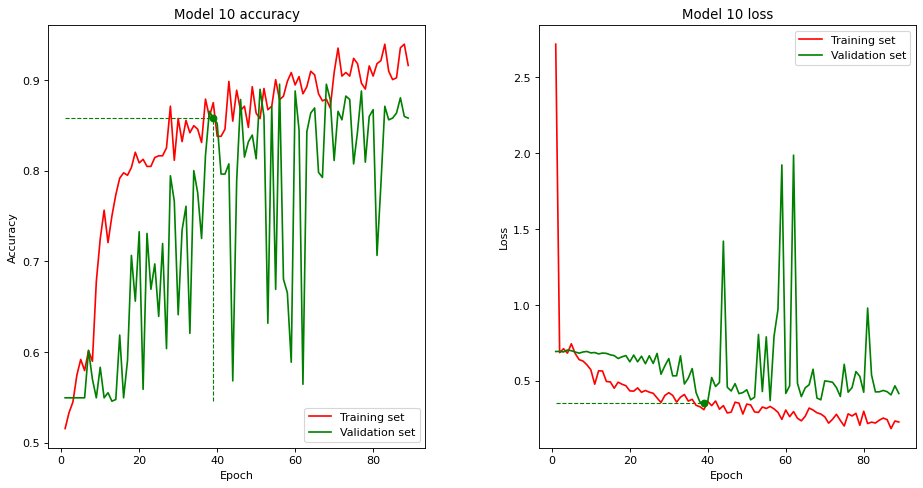

In [30]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.subplots_adjust(wspace=0.3)  # Adjust the space between the plots

# Plot Model 10 accuracy
axs[0].set_title('Model 10 accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].plot(epochs_10, tra_acc_10, 'r', label='Training set')
axs[0].plot(epochs_10, val_acc_10, 'g', label='Validation set')
axs[0].plot(opt_epoch_10, val_acc_10[opt_epoch_10-1], 'go')
axs[0].vlines(opt_epoch_10, min(val_acc_10), opt_val_acc_10, linestyle="dashed", color='g', linewidth=1)
axs[0].hlines(opt_val_acc_10, 1, opt_epoch_10, linestyle="dashed", color='g', linewidth=1)
axs[0].legend(loc='lower right')

# Plot Model 10 loss
axs[1].set_title('Model 10 loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].plot(epochs_10, tra_loss_10, 'r', label='Training set')
axs[1].plot(epochs_10, val_loss_10, 'g', label='Validation set')
axs[1].plot(opt_epoch_10, val_loss_10[opt_epoch_10-1], 'go')
axs[1].vlines(opt_epoch_10, min(val_loss_10), opt_val_loss_10, linestyle="dashed", color='g', linewidth=1)
axs[1].hlines(opt_val_loss_10, 1, opt_epoch_10, linestyle="dashed", color='g', linewidth=1)
axs[1].legend()

# Show the plots
plt.show()

## Experiment 11

In [31]:
# Model 11

model_11 = models.Sequential()
model_11.add(layers.Conv2D(32, (3, 3), input_shape=(150, 150, 1)))
model_11.add(layers.BatchNormalization(momentum=0.001))
model_11.add(layers.Activation("relu"))
model_11.add(layers.MaxPooling2D((2, 2)))
model_11.add(layers.Conv2D(64, (3, 3)))
model_11.add(layers.BatchNormalization(momentum=0.001))
model_11.add(layers.Activation("relu"))
model_11.add(layers.MaxPooling2D((2, 2)))
model_11.add(layers.Conv2D(128, (3, 3)))
model_11.add(layers.BatchNormalization(momentum=0.001))
model_11.add(layers.Activation("relu"))
model_11.add(layers.MaxPooling2D((2, 2)))
model_11.add(layers.Conv2D(256, (3, 3)))
model_11.add(layers.BatchNormalization(momentum=0.001))
model_11.add(layers.Activation("relu"))
model_11.add(layers.MaxPooling2D((2, 2)))
model_11.add(layers.Flatten())
model_11.add(layers.Dense(48, activation='relu'))
model_11.add(layers.Dropout(0.5))
model_11.add(layers.Dense(1, activation='sigmoid'))

model_11.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 batch_normalization_4 (Batc  (None, 148, 148, 32)     128       
 hNormalization)                                                 
                                                                 
 activation_4 (Activation)   (None, 148, 148, 32)      0         
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 batch_normalization_5 (Batc  (None, 72, 72, 64)      

In [32]:
# Early stopping (stop training after the validation loss reaches the minimum)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=50, verbose=1)

# Callback for checkpointing
checkpoint = ModelCheckpoint('model_11_2cl_best.h5',
        monitor='val_loss', mode='min', verbose=1,
        save_best_only=True, save_freq='epoch'
)

# Compile the model (note the decay!)
model_11.compile(optimizer=RMSprop(learning_rate=0.001, decay=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

# Train
history_11 = model_11.fit_generator(
        train_generator,
        steps_per_epoch=int(0.8*n_train_img) // 128,
        epochs=300,
        validation_data=validation_generator,
        callbacks=[checkpoint, earlystopping],
        shuffle=True,
        verbose=1,
        initial_epoch=0
)

# Save the final model
model_11.save('model_11_2cl_end.h5')

# Directory to copy the models to
destination_dir = "C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/"

# Ensure the destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Copy the saved models to the target directory
shutil.copy('model_11_2cl_best.h5', os.path.join(destination_dir, 'model_11_2cl_best.h5'))
shutil.copy('model_11_2cl_end.h5', os.path.join(destination_dir, 'model_11_2cl_end.h5'))

Epoch 1/300


<ipython-input-32-687aacbdf899>:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_11 = model_11.fit_generator(


16/16 [==============================] - ETA: 0s - loss: 1.9076 - accuracy: 0.5273
Epoch 1: val_loss improved from inf to 0.69263, saving model to model_11_2cl_best.h5
16/16 [==============================] - 40s 2s/step - loss: 1.9076 - accuracy: 0.5273 - val_loss: 0.6926 - val_accuracy: 0.5570
Epoch 2/300
16/16 [==============================] - ETA: 0s - loss: 0.6944 - accuracy: 0.4707
Epoch 2: val_loss improved from 0.69263 to 0.68758, saving model to model_11_2cl_best.h5
16/16 [==============================] - 37s 2s/step - loss: 0.6944 - accuracy: 0.4707 - val_loss: 0.6876 - val_accuracy: 0.5477
Epoch 3/300
16/16 [==============================] - ETA: 0s - loss: 0.7036 - accuracy: 0.5625
Epoch 3: val_loss improved from 0.68758 to 0.67383, saving model to model_11_2cl_best.h5
16/16 [==============================] - 39s 2s/step - loss: 0.7036 - accuracy: 0.5625 - val_loss: 0.6738 - val_accuracy: 0.5477
Epoch 4/300
16/16 [==============================] - ETA: 0s - loss: 0.7540 -

'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/model_11_2cl_end.h5'

In [33]:
# History of accuracy and loss
tra_loss_11 = history_11.history['loss']
tra_acc_11 = history_11.history['accuracy']
val_loss_11 = history_11.history['val_loss']
val_acc_11 = history_11.history['val_accuracy']

# Total number of epochs training
epochs_11 = range(1, len(tra_acc_11)+1)
end_epoch_11 = len(tra_acc_11)

# Epoch when reached the validation loss minimum
opt_epoch_11 = val_loss_11.index(min(val_loss_11)) + 1

# Loss and accuracy on the validation set
end_val_loss_11 = val_loss_11[-1]
end_val_acc_11 = val_acc_11[-1]
opt_val_loss_11 = val_loss_11[opt_epoch_11-1]
opt_val_acc_11 = val_acc_11[opt_epoch_11-1]

# Loss and accuracy on the test set
opt_model_11 = models.load_model('model_11_2cl_best.h5')
test_loss_11, test_acc_11 = model_11.evaluate(test_images, test_labels, verbose=False)
opt_test_loss_11, opt_test_acc_11 = opt_model_11.evaluate(test_images, test_labels, verbose=False)
opt_pred_11 = opt_model_11.predict(test_images)
pred_classes_11 = np.rint(opt_pred_11)

print("Model 11\n")

print("Epoch [end]: %d" % end_epoch_11)
print("Epoch [opt]: %d" % opt_epoch_11)
print("Valid accuracy [end]: %.4f" % end_val_acc_11)
print("Valid accuracy [opt]: %.4f" % opt_val_acc_11)
print("Test accuracy [end]:  %.4f" % test_acc_11)
print("Test accuracy [opt]:  %.4f" % opt_test_acc_11)
print("Valid loss [end]: %.4f" % end_val_loss_11)
print("Valid loss [opt]: %.4f" % opt_val_loss_11)
print("Test loss [end]:  %.4f" % test_loss_11)
print("Test loss [opt]:  %.4f" % opt_test_loss_11)

print(classification_report(test_labels, pred_classes_11, digits=4))

Model 11

Epoch [end]: 89
Epoch [opt]: 39
Valid accuracy [end]: 0.8953
Valid accuracy [opt]: 0.8785
Test accuracy [end]:  0.8571
Test accuracy [opt]:  0.8423
Valid loss [end]: 0.4102
Valid loss [opt]: 0.3283
Test loss [end]:  0.5240
Test loss [opt]:  0.3779
              precision    recall  f1-score   support

           0     0.8424    0.8659    0.8540       179
           1     0.8421    0.8153    0.8285       157

    accuracy                         0.8423       336
   macro avg     0.8422    0.8406    0.8412       336
weighted avg     0.8423    0.8423    0.8421       336



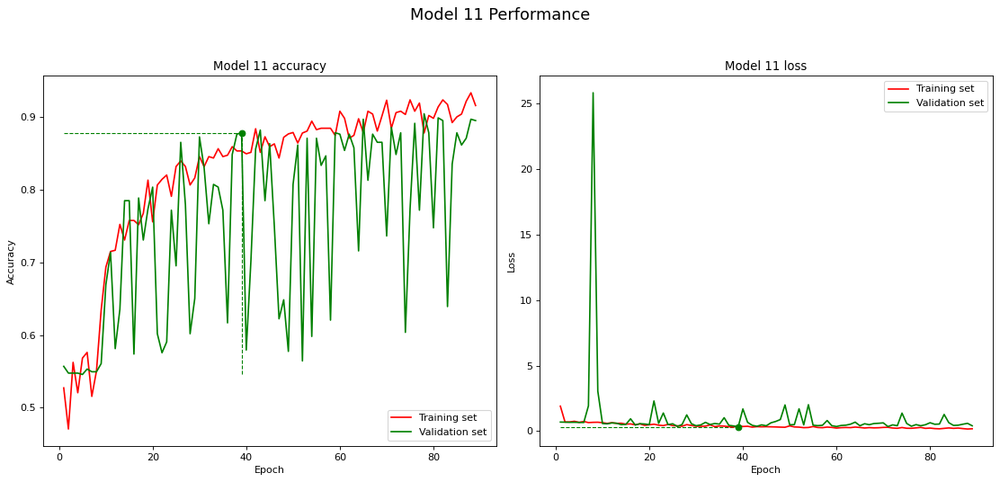

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7), dpi=80, facecolor='w', edgecolor='k')
fig.suptitle('Model 11 Performance', fontsize=16)

# Model accuracy
ax1.set_title('Model 11 accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.plot(epochs_11, tra_acc_11, 'r', label='Training set')
ax1.plot(epochs_11, val_acc_11, 'g', label='Validation set')
ax1.plot(opt_epoch_11, val_acc_11[opt_epoch_11-1], 'go')
ax1.vlines(opt_epoch_11, min(val_acc_11), opt_val_acc_11, linestyle="dashed", color='g', linewidth=1)
ax1.hlines(opt_val_acc_11, 1, opt_epoch_11, linestyle="dashed", color='g', linewidth=1)
ax1.legend(loc='lower right')

# Model loss
ax2.set_title('Model 11 loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.plot(epochs_11, tra_loss_11, 'r', label='Training set')
ax2.plot(epochs_11, val_loss_11, 'g', label='Validation set')
ax2.plot(opt_epoch_11, val_loss_11[opt_epoch_11-1], 'go')
ax2.vlines(opt_epoch_11, min(val_loss_11), opt_val_loss_11, linestyle="dashed", color='g', linewidth=1)
ax2.hlines(opt_val_loss_11, 1, opt_epoch_11, linestyle="dashed", color='g', linewidth=1)
ax2.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust subplots to fit in figure area.
plt.show()

# Error analysis

In [106]:
def get_errors(pred):
    errors = []
    mispred = []
    hard_mispred = []

    for l,p,img in zip(test_labels, pred, test_images):
        err = abs(l-p)
        errors.append(err)
        if err > 0.5:
            mispred.append((l,p,img))
        if err > 0.8:
            hard_mispred.append((l,p,img))

    return errors, mispred, hard_mispred


def show_error_stats(errors, mispred, hard_mispred):

    #print("Number of test images: %d" % len(test_labels))
    Mispredictions = len(mispred)
    Hardmispred =len(hard_mispred)

    sns.distplot(errors, kde=False, rug=True, bins=10, vertical=False, label='samples', axlabel='error').set_title('Absolute error distribution');

    for l,p,img in hard_mispred:
        plt.figure()
        plt.imshow(img[:,:,0], cmap='gray')
        plt.title('Misclassified as ' + ('mass' if l==0 else 'calcification') + ' with %.2f confidence' % (100*abs(p-l)))
        plt.axis('off')
        
    return Mispredictions, Hardmispred


        # Correcting the paths
model_dir = 'C:/Users/CHRISTIANAH/Documents/Aaaa/DS/models/'

opt_model_0 = models.load_model(os.path.join(model_dir, 'model_0_2cl_best.h5'))
opt_model_1 = models.load_model(os.path.join(model_dir, 'model_1_2cl_best.h5'))
opt_model_2 = models.load_model(os.path.join(model_dir, 'model_2_2cl_best.h5'))
opt_model_3 = models.load_model(os.path.join(model_dir, 'model_3_2cl_best.h5'))
opt_model_4 = models.load_model(os.path.join(model_dir, 'model_4_2cl_best.h5'))
opt_model_5 = models.load_model(os.path.join(model_dir, 'model_5_2cl_best.h5'))
opt_model_6 = models.load_model(os.path.join(model_dir, 'model_6_2cl_best.h5'))
opt_model_7 = models.load_model(os.path.join(model_dir, 'model_7_2cl_best.h5'))
opt_model_8 = models.load_model(os.path.join(model_dir, 'model_8_2cl_best.h5'))
opt_model_9 = models.load_model(os.path.join(model_dir, 'model_9_2cl_best.h5'))
opt_model_10 = models.load_model(os.path.join(model_dir, 'model_10_2cl_best.h5'))
opt_model_11 = models.load_model(os.path.join(model_dir, 'model_11_2cl_best.h5'))

pred_0 = opt_model_0.predict(test_images)
pred_1 = opt_model_1.predict(test_images)
pred_2 = opt_model_2.predict(test_images)
pred_3 = opt_model_3.predict(test_images)
pred_4 = opt_model_4.predict(test_images)
pred_5 = opt_model_5.predict(test_images)
pred_6 = opt_model_6.predict(test_images)
pred_7 = opt_model_7.predict(test_images)
pred_8 = opt_model_8.predict(test_images)
pred_9 = opt_model_9.predict(test_images)
pred_10 = opt_model_10.predict(test_images)
pred_11 = opt_model_11.predict(test_images)

errors_0, mispred_0, hard_mispred_0 = get_errors(pred_0)
errors_1, mispred_1, hard_mispred_1 = get_errors(pred_1)
errors_2, mispred_2, hard_mispred_2 = get_errors(pred_2)
errors_3, mispred_3, hard_mispred_3 = get_errors(pred_3)
errors_4, mispred_4, hard_mispred_4 = get_errors(pred_4)
errors_5, mispred_5, hard_mispred_5 = get_errors(pred_5)
errors_6, mispred_6, hard_mispred_6 = get_errors(pred_6)
errors_7, mispred_7, hard_mispred_7 = get_errors(pred_7)
errors_8, mispred_8, hard_mispred_8 = get_errors(pred_8)
errors_9, mispred_9, hard_mispred_9 = get_errors(pred_9)
errors_10, mispred_10, hard_mispred_10 = get_errors(pred_10)
errors_11, mispred_11, hard_mispred_11 = get_errors(pred_11)

The Error of all the models

In [ ]:
mispredicted = []
hard_predicted = []

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
<ipython-input-106-90649269692c>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


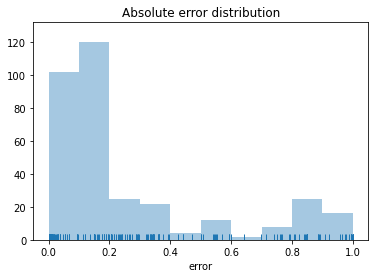

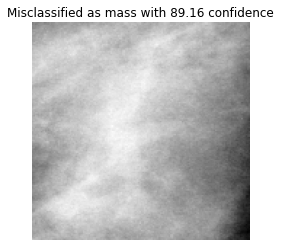

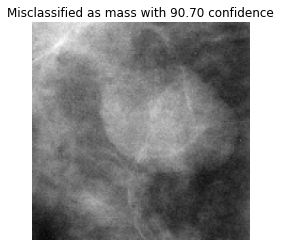

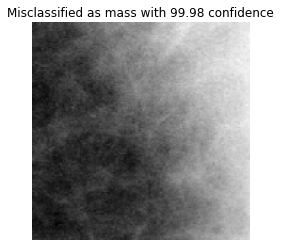

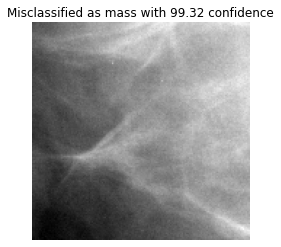

...

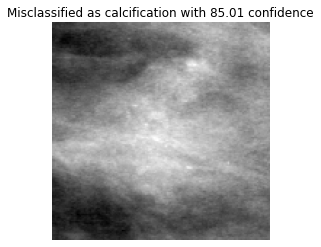

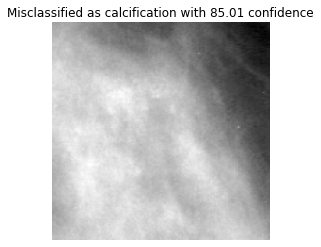

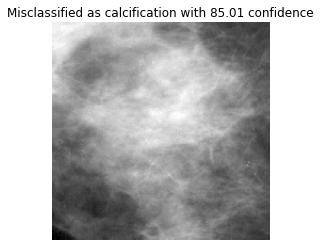

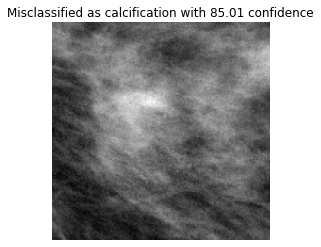

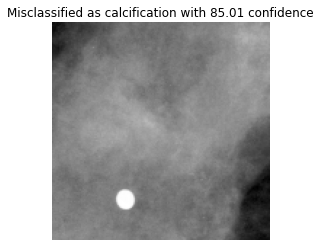

In [110]:
print("Model 0")
outputt0 = show_error_stats(errors_0, mispred_0, hard_mispred_0)
mispredicted.append(outputt0[0])
hard_predicted.append(outputt0[1])

In [116]:
hard_predicted

[41, 3, 16]

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


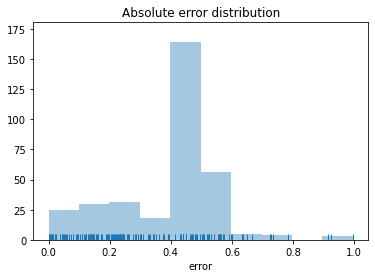

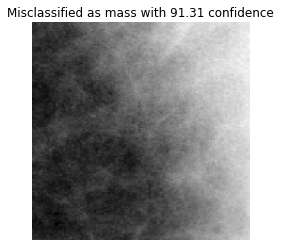

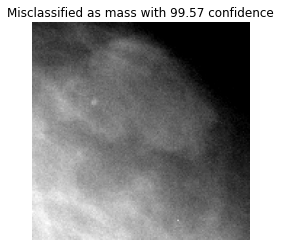

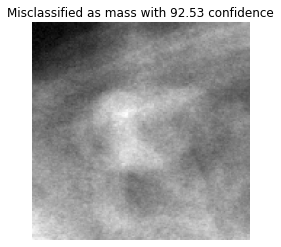

In [113]:
print("Model 1")
outputt1 = show_error_stats(errors_1, mispred_1, hard_mispred_1)
mispredicted.append(outputt1[0])
hard_predicted.append(outputt1[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


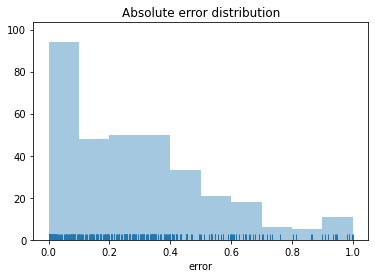

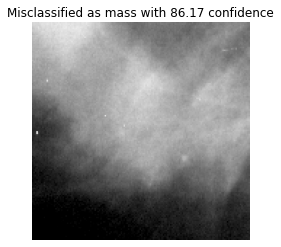

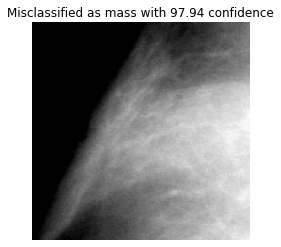

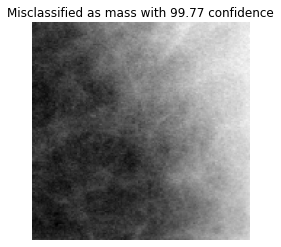

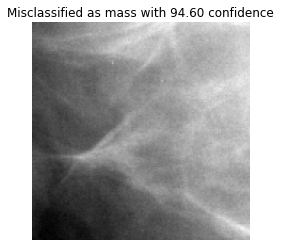

...

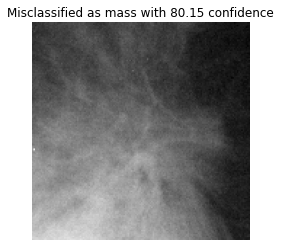

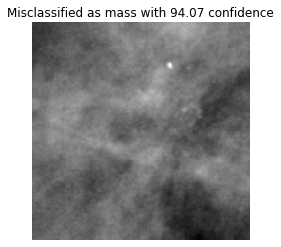

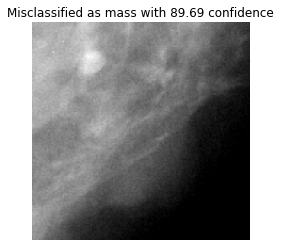

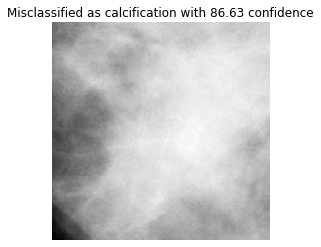

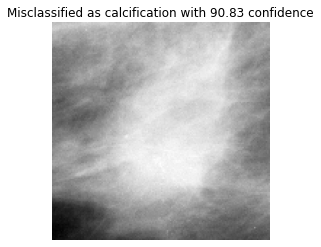

In [115]:
print("Model 2")
outputt2 = show_error_stats(errors_2, mispred_2, hard_mispred_2)
mispredicted.append(outputt2[0])
hard_predicted.append(outputt2[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


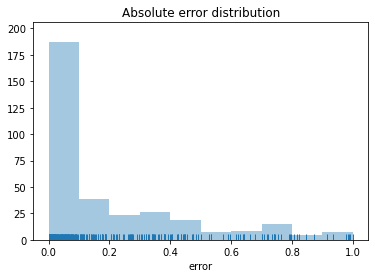

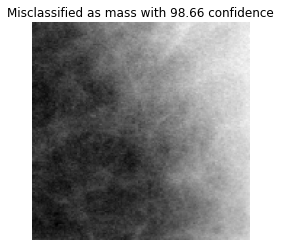

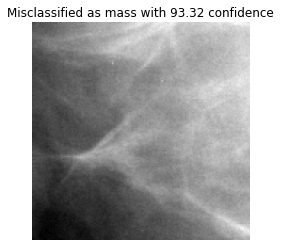

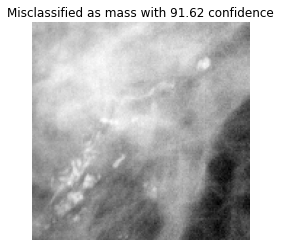

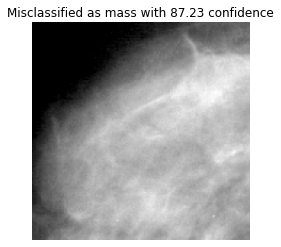

...

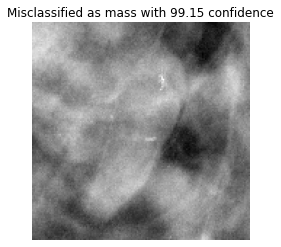

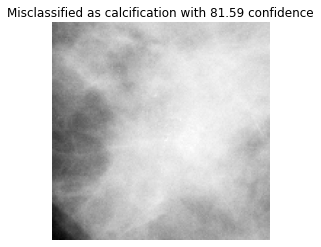

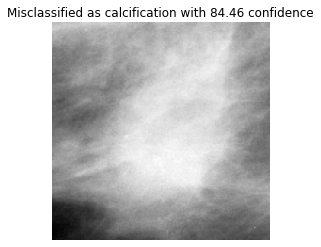

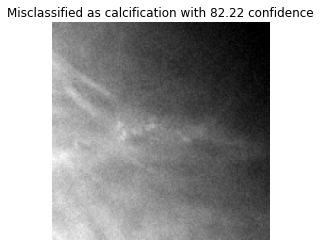

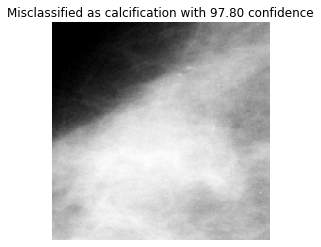

In [117]:
print("Model 3")
outputt3 = show_error_stats(errors_3, mispred_3, hard_mispred_3)
mispredicted.append(outputt3[0])
hard_predicted.append(outputt3[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


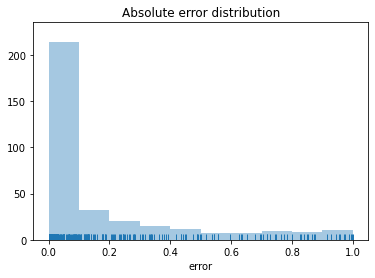

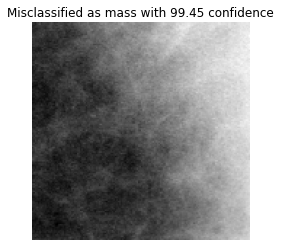

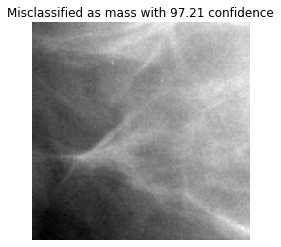

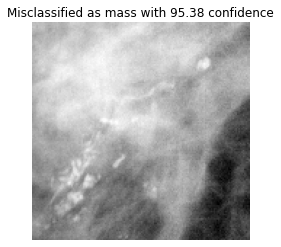

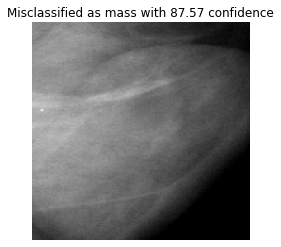

...

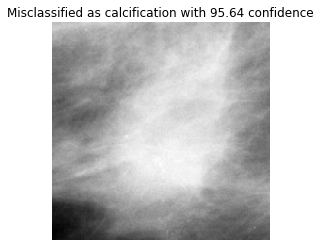

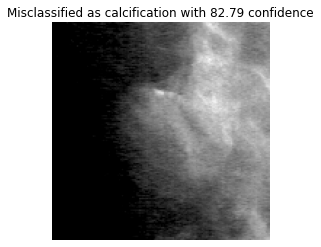

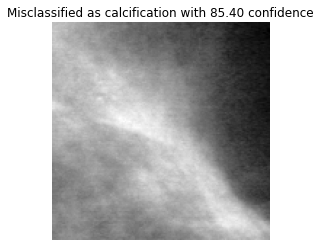

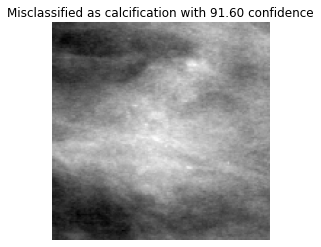

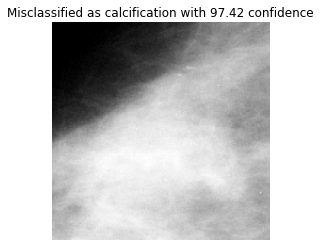

In [118]:
print("Model 4")
outputt4 = show_error_stats(errors_4, mispred_4, hard_mispred_4)
mispredicted.append(outputt4[0])
hard_predicted.append(outputt4[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


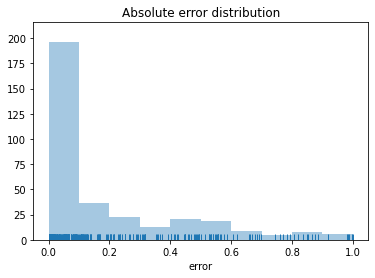

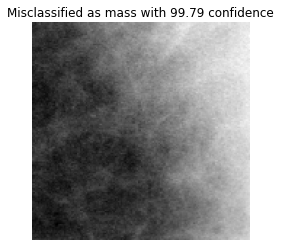

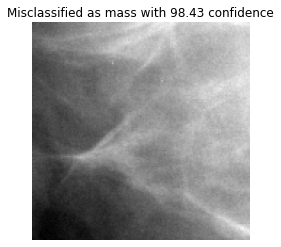

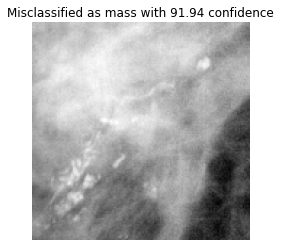

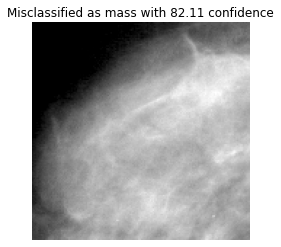

...

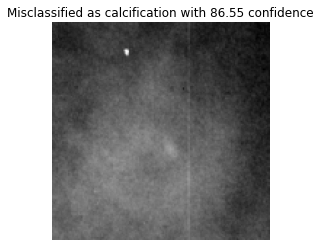

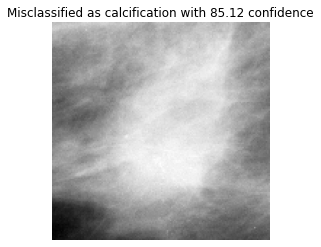

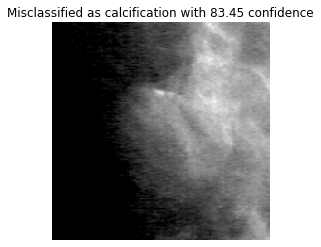

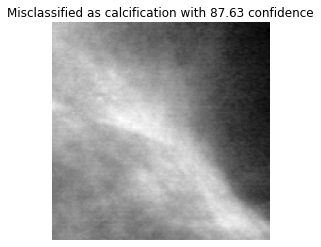

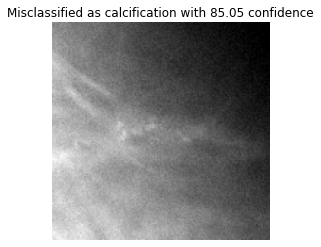

In [119]:
print("Model 5")
outputt5 = show_error_stats(errors_5, mispred_5, hard_mispred_5)
mispredicted.append(outputt5[0])
hard_predicted.append(outputt5[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
<ipython-input-106-90649269692c>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


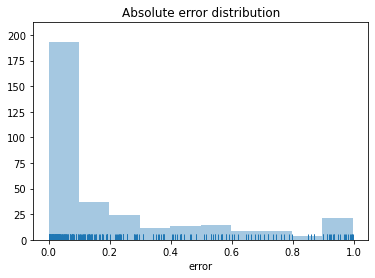

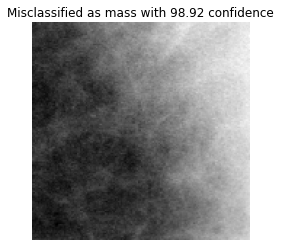

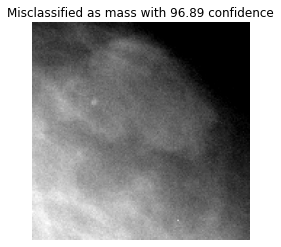

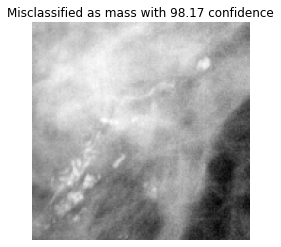

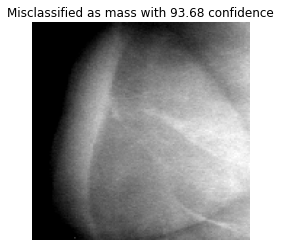

...

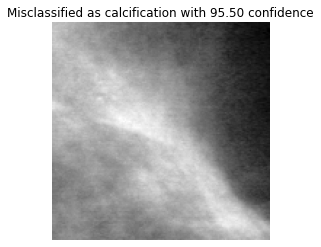

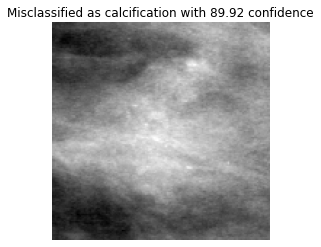

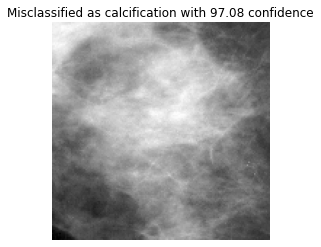

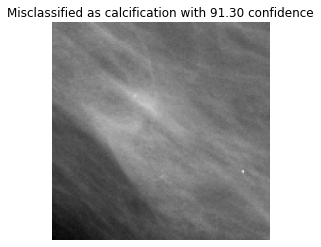

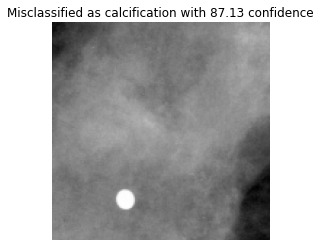

In [120]:
print("Model 6")
outputt6 = show_error_stats(errors_6, mispred_6, hard_mispred_6)
mispredicted.append(outputt6[0])
hard_predicted.append(outputt6[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
<ipython-input-106-90649269692c>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


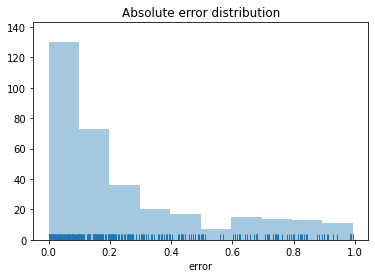

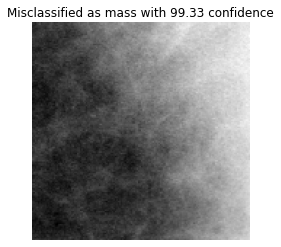

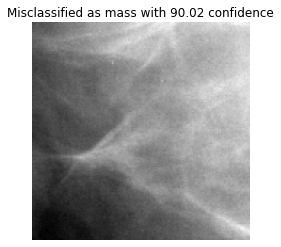

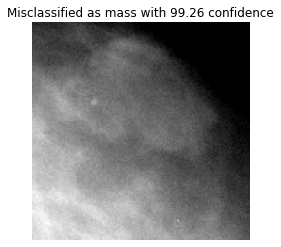

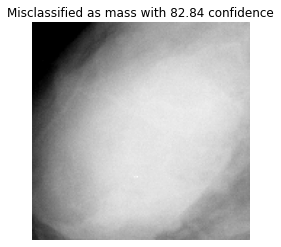

...

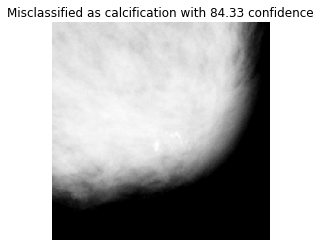

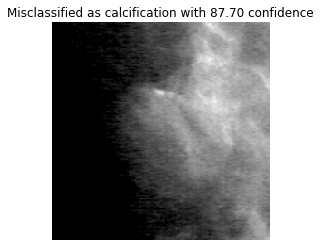

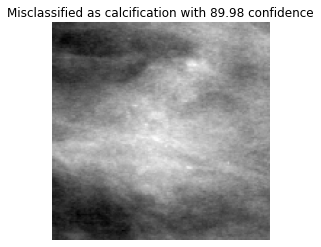

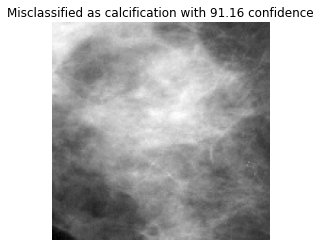

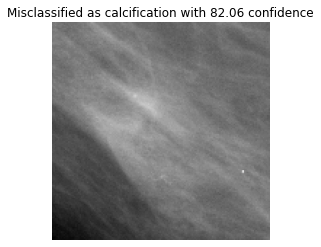

In [121]:
print("Model 7")
outputt7 = show_error_stats(errors_7, mispred_7, hard_mispred_7)
mispredicted.append(outputt7[0])
hard_predicted.append(outputt7[1])

In [99]:
#Number of test images: 336

outputt0 = show_error_stats(errors_0, mispred_0, hard_mispred_0)
outputt1 = show_error_stats(errors_1, mispred_1, hard_mispred_1)
outputt2 = show_error_stats(errors_2, mispred_2, hard_mispred_2)
outputt3 = show_error_stats(errors_3, mispred_3, hard_mispred_3)
outputt4 = show_error_stats(errors_4, mispred_4, hard_mispred_4)
outputt5 = show_error_stats(errors_5, mispred_5, hard_mispred_5)
outputt6 = show_error_stats(errors_6, mispred_6, hard_mispred_6)
outputt7 = show_error_stats(errors_7, mispred_7, hard_mispred_7)
outputt8 = show_error_stats(errors_8, mispred_8, hard_mispred_8)
outputt9 = show_error_stats(errors_9, mispred_9, hard_mispred_9)
outputt10 = show_error_stats(errors_10, mispred_10, hard_mispred_10)
outputt11 = show_error_stats(errors_11, mispred_11, hard_mispred_11)

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


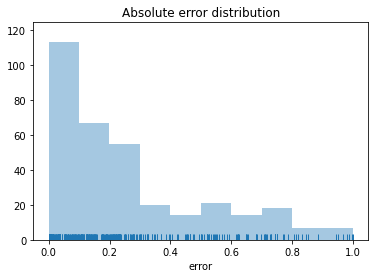

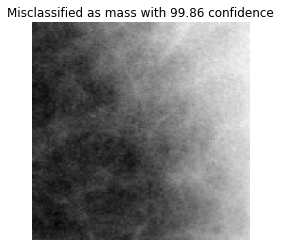

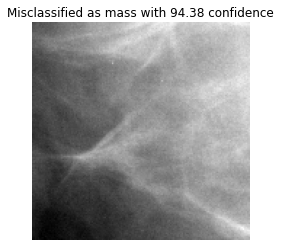

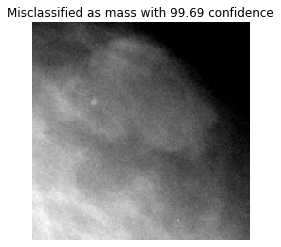

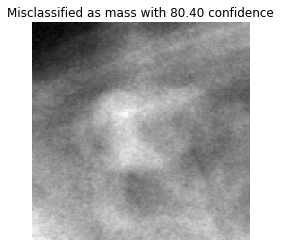

...

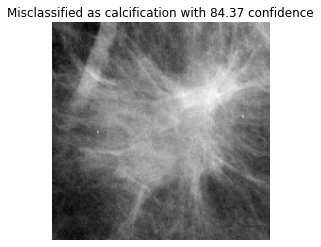

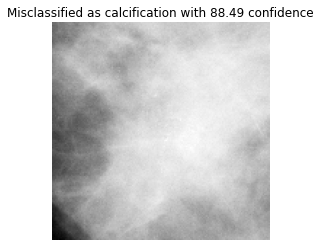

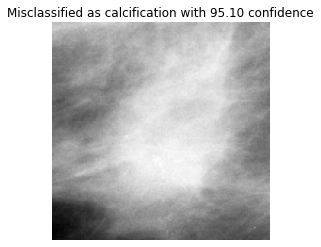

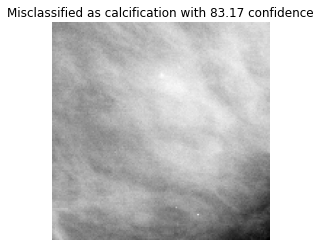

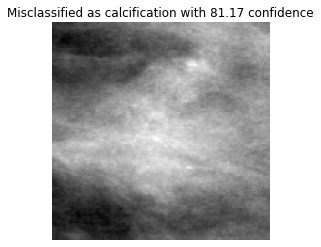

In [122]:
print("Model 8")
outputt8 = show_error_stats(errors_8, mispred_8, hard_mispred_8)
mispredicted.append(outputt8[0])
hard_predicted.append(outputt8[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


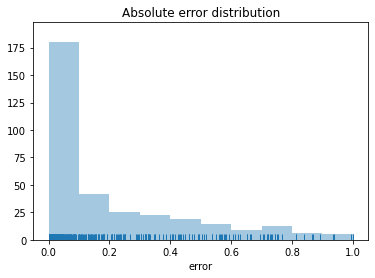

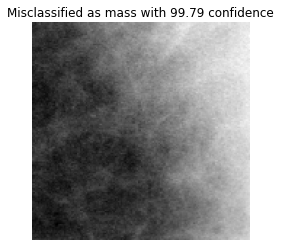

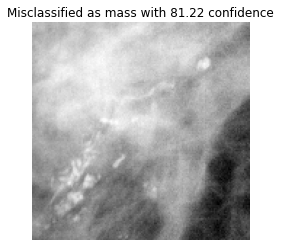

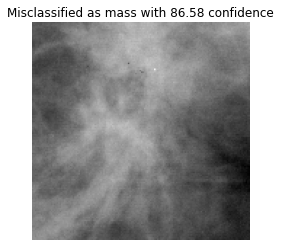

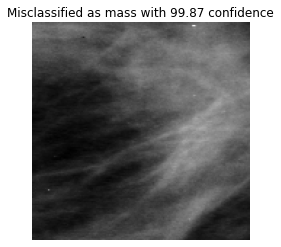

...

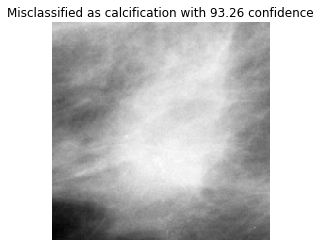

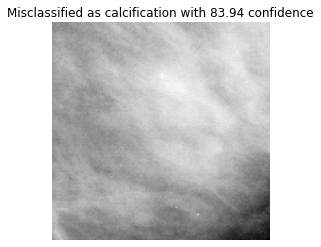

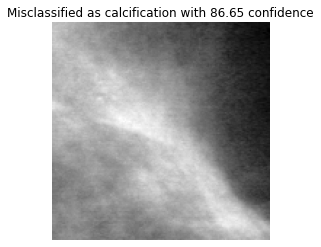

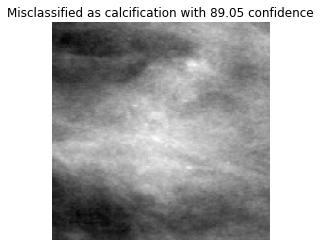

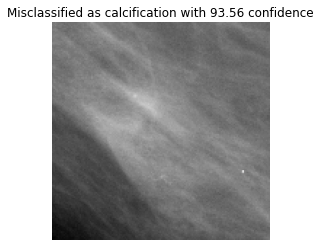

In [124]:
print("Model 9")
outputt9 = show_error_stats(errors_9, mispred_9, hard_mispred_9)
mispredicted.append(outputt9[0])
hard_predicted.append(outputt9[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
<ipython-input-106-90649269692c>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


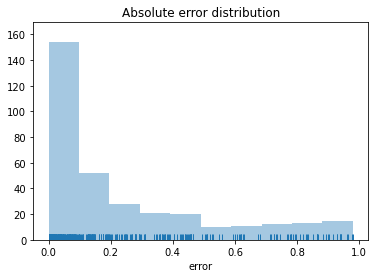

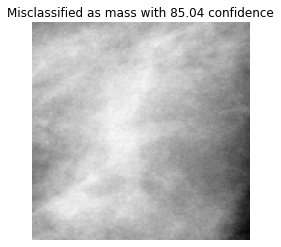

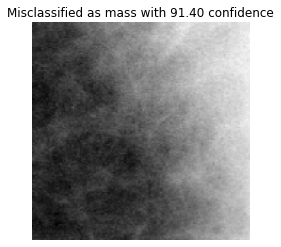

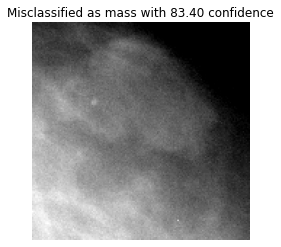

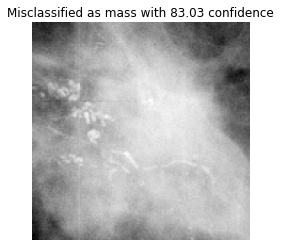

...

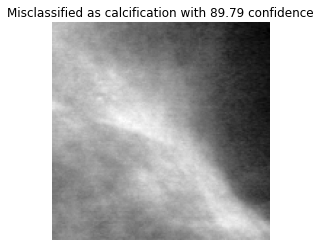

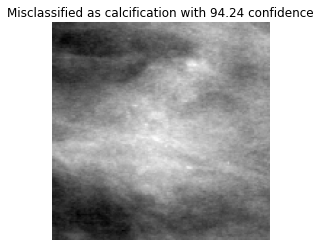

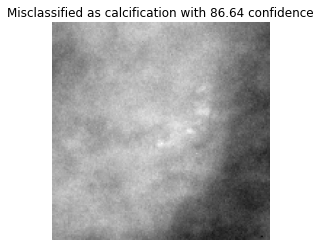

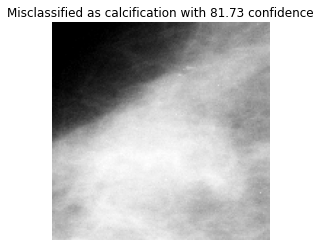

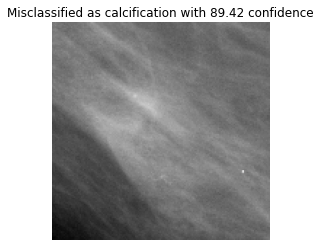

In [125]:
print("Model 10")
outputt10 = show_error_stats(errors_10, mispred_10, hard_mispred_10)
mispredicted.append(outputt10[0])
hard_predicted.append(outputt10[1])

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


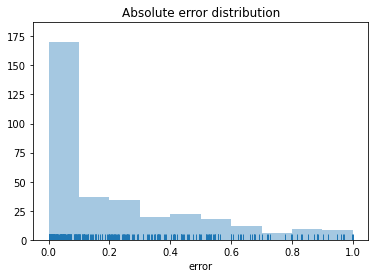

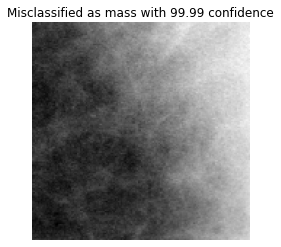

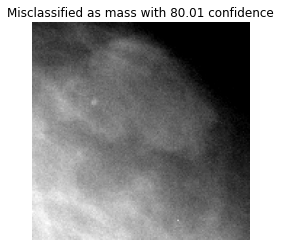

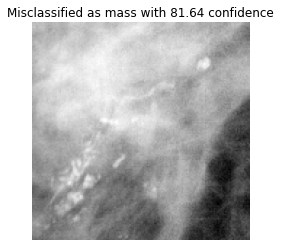

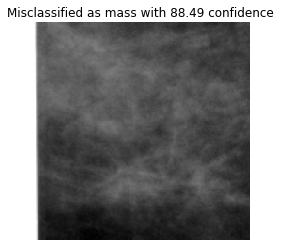

...

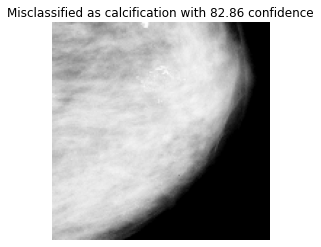

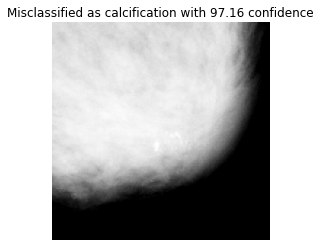

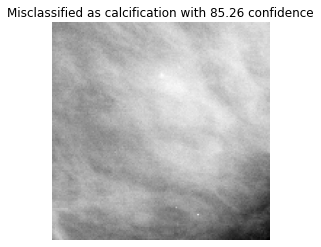

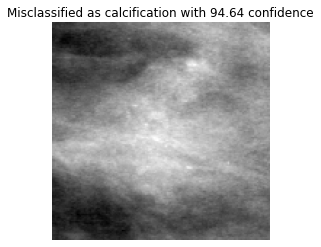

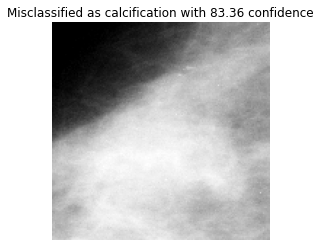

In [126]:
print("Model 11")
outputt11 = show_error_stats(errors_11, mispred_11, hard_mispred_11)
mispredicted.append(outputt11[0])
hard_predicted.append(outputt11[1])

In [2]:
#Putting the report of all the 12 models together in a file
import json

# Define the experiments dictionary with all experiment details
experiments = {
    0: {
        'Epoch_end': 100,
        'Epoch_opt': 70,
        'Valid_accuracy_end': 0.8617,
        'Valid_accuracy_opt': 0.8636,
        'Test_accuracy_end': 0.8155,
        'Test_accuracy_opt': 0.8125,
        'Valid_loss_end': 0.4413,
        'Valid_loss_opt': 0.3840,
        'Test_loss_end': 0.7949,
        'Test_loss_opt': 0.6238,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8494    0.7877    0.8174       179
           1     0.7765    0.8408    0.8073       157

    accuracy                         0.8125       336
   macro avg     0.8129    0.8142    0.8124       336
weighted avg     0.8153    0.8125    0.8127       336
        '''
    },
    1: {
        'Epoch_end': 100,
        'Epoch_opt': 84,
        'Valid_accuracy_end': 0.7907,
        'Valid_accuracy_opt': 0.8168,
        'Test_accuracy_end': 0.7589,
        'Test_accuracy_opt': 0.7976,
        'Valid_loss_end': 0.5675,
        'Valid_loss_opt': 0.4744,
        'Test_loss_end': 0.7565,
        'Test_loss_opt': 0.5474,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.7817    0.8603    0.8191       179
           1     0.8201    0.7261    0.7703       157

    accuracy                         0.7976       336
   macro avg     0.8009    0.7932    0.7947       336
weighted avg     0.7997    0.7976    0.7963       336
        '''
    },
    2: {
        'Epoch_end': 100,
        'Epoch_opt': 92,
        'Valid_accuracy_end': 0.8542,
        'Valid_accuracy_opt': 0.8766,
        'Test_accuracy_end': 0.8185,
        'Test_accuracy_opt': 0.8185,
        'Valid_loss_end': 0.3549,
        'Valid_loss_opt': 0.3207,
        'Test_loss_end': 0.4722,
        'Test_loss_opt': 0.4841,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8172    0.8492    0.8329       179
           1     0.8200    0.7834    0.8013       157

    accuracy                         0.8185       336
   macro avg     0.8186    0.8163    0.8171       336
weighted avg     0.8185    0.8185    0.8181       336
        '''
    },
    3: {
        'Epoch_end': 256,
        'Epoch_opt': 216,
        'Valid_accuracy_end': 0.9028,
        'Valid_accuracy_opt': 0.9065,
        'Test_accuracy_end': 0.8542,
        'Test_accuracy_opt': 0.8750,
        'Valid_loss_end': 0.2941,
        'Valid_loss_opt': 0.2094,
        'Test_loss_end': 0.3679,
        'Test_loss_opt': 0.3389,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8960    0.8659    0.8807       179
           1     0.8528    0.8854    0.8688       157

    accuracy                         0.8750       336
   macro avg     0.8744    0.8756    0.8747       336
weighted avg     0.8758    0.8750    0.8751       336
        '''
    },
    4: {
        'Epoch_end': 349,
        'Epoch_opt': 269,
        'Valid_accuracy_end': 0.8916,
        'Valid_accuracy_opt': 0.9196,
        'Test_accuracy_end': 0.8690,
        'Test_accuracy_opt': 0.8720,
        'Valid_loss_end': 0.2626,
        'Valid_loss_opt': 0.1962,
        'Test_loss_end': 0.3604,
        'Test_loss_opt': 0.3527,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8617    0.9050    0.8828       179
           1     0.8851    0.8344    0.8590       157

    accuracy                         0.8720       336
   macro avg     0.8734    0.8697    0.8709       336
weighted avg     0.8727    0.8720    0.8717       336
        '''
    },
    5: {
        'Epoch_end': 500,
        'Epoch_opt': 478,
        'Valid_accuracy_end': 0.9009,
        'Valid_accuracy_opt': 0.9159,
        'Test_accuracy_end': 0.8720,
        'Test_accuracy_opt': 0.8601,
        'Valid_loss_end': 0.2187,
        'Valid_loss_opt': 0.1909,
        'Test_loss_end': 0.3301,
        'Test_loss_opt': 0.3381,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8474    0.8994    0.8726       179
           1     0.8767    0.8153    0.8449       157

    accuracy                         0.8601       336
   macro avg     0.8620    0.8574    0.8588       336
weighted avg     0.8611    0.8601    0.8597       336
        '''
    },
    6: {
        'Epoch_end': 82,
        'Epoch_opt': 2,
        'Valid_accuracy_end': 0.8748,
        'Valid_accuracy_opt': 0.8636,
        'Test_accuracy_end': 0.8512,
        'Test_accuracy_opt': 0.8304,
        'Valid_loss_end': 0.7167,
        'Valid_loss_opt': 0.4150,
        'Test_loss_end': 0.6784,
        'Test_loss_opt': 0.4271,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8466    0.8324    0.8394       179
           1     0.8125    0.8280    0.8202       157

    accuracy                         0.8304       336
   macro avg     0.8295    0.8302    0.8298       336
weighted avg     0.8307    0.8304    0.8304       336
        '''
    },
    7: {
        'Epoch_end': 207,
        'Epoch_opt': 127,
        'Valid_accuracy_end': 0.8748,
        'Valid_accuracy_opt': 0.8579,
        'Test_accuracy_end': 0.8244,
        'Test_accuracy_opt': 0.8214,
        'Valid_loss_end': 0.4017,
        'Valid_loss_opt': 0.3612,
        'Test_loss_end': 0.4967,
        'Test_loss_opt': 0.4367,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8216    0.8492    0.8352       179
           1     0.8212    0.7898    0.8052       157

    accuracy                         0.8214       336
   macro avg     0.8214    0.8195    0.8202       336
weighted avg     0.8214    0.8214    0.8212       336
        '''
    },
    8: {
        'Epoch_end': 500,
        'Epoch_opt': 454,
        'Valid_accuracy_end': 0.8598,
        'Valid_accuracy_opt': 0.8654,
        'Test_accuracy_end': 0.8006,
        'Test_accuracy_opt': 0.8006,
        'Valid_loss_end': 0.3250,
        'Valid_loss_opt': 0.3181,
        'Test_loss_end': 0.4329,
        'Test_loss_opt': 0.4281,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8146    0.8101    0.8123       179
           1     0.7848    0.7898    0.7873       157

    accuracy                         0.8006       336
   macro avg     0.7997    0.7999    0.7998       336
weighted avg     0.8007    0.8006    0.8006       336
        '''
    },
    9: {
        'Epoch_end': 463,
        'Epoch_opt': 383,
        'Valid_accuracy_end': 0.8654,
        'Valid_accuracy_opt': 0.8822,
        'Test_accuracy_end': 0.8661,
        'Test_accuracy_opt': 0.8601,
        'Valid_loss_end': 0.3629,
        'Valid_loss_opt': 0.3326,
        'Test_loss_end': 0.3682,
        'Test_loss_opt': 0.3359,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8511    0.8939    0.8719       179
           1     0.8716    0.8217    0.8459       157

    accuracy                         0.8601       336
   macro avg     0.8613    0.8578    0.8589       336
weighted avg     0.8607    0.8601    0.8598       336
        '''
    },
    10: {
        'Epoch_end': 89,
        'Epoch_opt': 39,
        'Valid_accuracy_end': 0.8579,
        'Valid_accuracy_opt': 0.8579,
        'Test_accuracy_end': 0.8363,
        'Test_accuracy_opt': 0.8214,
        'Valid_loss_end': 0.4160,
        'Valid_loss_opt': 0.3557,
        'Test_loss_end': 0.4071,
        'Test_loss_opt': 0.4259,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8362    0.8268    0.8315       179
           1     0.8050    0.8153    0.8101       157

    accuracy                         0.8214       336
   macro avg     0.8206    0.8211    0.8208       336
weighted avg     0.8216    0.8214    0.8215       336
        '''
    },
    11: {
        'Epoch_end': 89,
        'Epoch_opt': 39,
        'Valid_accuracy_end': 0.8953,
        'Valid_accuracy_opt': 0.8785,
        'Test_accuracy_end': 0.8571,
        'Test_accuracy_opt': 0.8423,
        'Valid_loss_end': 0.4102,
        'Valid_loss_opt': 0.3283,
        'Test_loss_end': 0.5240,
        'Test_loss_opt': 0.3779,
        'Classification_report': '''
              precision    recall  f1-score   support

           0     0.8424    0.8659    0.8540       179
           1     0.8421    0.8153    0.8285       157

    accuracy                         0.8423       336
   macro avg     0.8422    0.8406    0.8412       336
weighted avg     0.8423    0.8423    0.8421       336
        '''
    }
}

# Save experiments dictionary to a JSON file
with open('experiments.json', 'w') as f:
    json.dump(experiments, f, indent=4)



In [3]:
# Load data from JSON file
with open('experiments.json', 'r') as f:
    experiments_data = json.load(f)

In [4]:
# Initialize lists to store metrics
epochs_end = []
epochs_opt = []
val_accuracies_end = []
val_accuracies_opt = []
test_accuracies_end = []
test_accuracies_opt = []
val_losses_end = []
val_losses_opt = []
test_losses_end = []
test_losses_opt = []
precision = []
recall = []
f1_score = []

In [5]:
# Extract metrics from experiments
for key, experiment in experiments_data.items():
    epochs_end.append(experiment['Epoch_end'])
    epochs_opt.append(experiment['Epoch_opt'])
    val_accuracies_end.append(experiment['Valid_accuracy_end'])
    val_accuracies_opt.append(experiment['Valid_accuracy_opt'])
    test_accuracies_end.append(experiment['Test_accuracy_end'])
    test_accuracies_opt.append(experiment['Test_accuracy_opt'])
    val_losses_end.append(experiment['Valid_loss_end'])
    val_losses_opt.append(experiment['Valid_loss_opt'])
    test_losses_end.append(experiment['Test_loss_end'])
    test_losses_opt.append(experiment['Test_loss_opt'])

    # Process classification report to extract F1-score for both experiments
    classification_report = experiment['Classification_report'].strip().split('\n')
    report_data = [line.split() for line in classification_report[2:]]
    precision.append(float(report_data[4][2]))
    recall.append(float(report_data[4][3]))
    f1_score.append(float(report_data[4][4]))

In [9]:
# Create a DataFrame
data = {
    'Epochs End': epochs_end,
    'Epochs Opt': epochs_opt,
    'Valid Accuracy End': val_accuracies_end,
    'Valid Accuracy Opt': val_accuracies_opt,
    'Test Accuracy End': test_accuracies_end,
    'Test Accuracy Opt': test_accuracies_opt,
    'Valid Loss End': val_losses_end,
    'Valid Loss Opt': val_losses_opt,
    'Test Loss End': test_losses_end,
    'Test Loss Opt': test_losses_opt,
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1_score,
    'Number of Wrong Predictions': mispredicted,
    'Number of Hard Predictions': hard_predicted
}

df = pd.DataFrame(data)

In [8]:
# Create a DataFrame
data = {
    'Epochs End': epochs_end,
    'Epochs Opt': epochs_opt,
    'Valid Accuracy End': val_accuracies_end,
    'Valid Accuracy Opt': val_accuracies_opt,
    'Test Accuracy End': test_accuracies_end,
    'Test Accuracy Opt': test_accuracies_opt,
    'Valid Loss End': val_losses_end,
    'Valid Loss Opt': val_losses_opt,
    'Test Loss End': test_losses_end,
    'Test Loss Opt': test_losses_opt,
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1_score
}

df = pd.DataFrame(data)

# Assuming df is already created
# Save the DataFrame to an Excel file
df.to_excel('model_results.xlsx', index=False)

# Confirm the file is saved successfully
print("DataFrame has been saved to 'model_results.xlsx'")

DataFrame has been saved to 'model_results.xlsx'


In [10]:
#Printing DF
df

,Epochs End,Epochs Opt,Valid Accuracy End,Valid Accuracy Opt,Test Accuracy End,Test Accuracy Opt,Valid Loss End,Valid Loss Opt,Test Loss End,Test Loss Opt,Precision,Recall,F1 Score
0,100,70,0.8617,0.8636,0.8155,0.8125,0.4413,0.3840,0.7949,0.6238,0.8129,0.8142,0.8124
1,100,84,0.7907,0.8168,0.7589,0.7976,0.5675,0.4744,0.7565,0.5474,0.8009,0.7932,0.7947
2,100,92,0.8542,0.8766,0.8185,0.8185,0.3549,0.3207,0.4722,0.4841,0.8186,0.8163,0.8171
3,256,216,0.9028,0.9065,0.8542,0.8750,0.2941,0.2094,0.3679,0.3389,0.8744,0.8756,0.8747
4,349,269,0.8916,0.9196,0.8690,0.8720,0.2626,0.1962,0.3604,0.3527,0.8734,0.8697,0.8709
5,500,478,0.9009,0.9159,0.8720,0.8601,0.2187,0.1909,0.3301,0.3381,0.8620,0.8574,0.8588
6,82,2,0.8748,0.8636,0.8512,0.8304,0.7167,0.4150,0.6784,0.4271,0.8295,0.8302,0.8298
7,207,127,0.8748,0.8579,0.8244,0.8214,0.4017,0.3612,0.4967,0.4367,0.8214,0.8195,0.8202
8,500,454,0.8598,0.8654,0.8006,0.8006,0.3250,0.3181,0.4329,0.4281,0.7997,0.7999,0.7998
9,463,383,0.8654,0.8822,0.8661,0.8601,0.3629,0.3326,0.3682,0.3359,0.8613,0.8578,0.8589


In [133]:
# Sort by 'F1 Score' and 'Test Accuracy Opt' in descending order,
# then by 'Number of Hard Predictions' and 'Number of Wrong Predictions' in ascending order
df_sorted = df.sort_values(
    by=['F1 Score', 'Test Accuracy Opt', 'Number of Hard Predictions', 'Number of Wrong Predictions'], 
    ascending=[False, False, True, True]
)

In [134]:
# Print the sorted DataFrame
df_sorted

,Epochs End,Epochs Opt,Valid Accuracy End,Valid Accuracy Opt,Test Accuracy End,Test Accuracy Opt,Valid Loss End,Valid Loss Opt,Test Loss End,Test Loss Opt,Precision,Recall,F1 Score,Number of Wrong Predictions,Number of Hard Predictions
3,256,216,0.9028,0.9065,0.8542,0.8750,0.2941,0.2094,0.3679,0.3389,0.8744,0.8756,0.8747,42,12
4,349,269,0.8916,0.9196,0.8690,0.8720,0.2626,0.1962,0.3604,0.3527,0.8734,0.8697,0.8709,43,19
9,463,383,0.8654,0.8822,0.8661,0.8601,0.3629,0.3326,0.3682,0.3359,0.8613,0.8578,0.8589,47,11
5,500,478,0.9009,0.9159,0.8720,0.8601,0.2187,0.1909,0.3301,0.3381,0.8620,0.8574,0.8588,47,14
11,89,39,0.8953,0.8785,0.8571,0.8423,0.4102,0.3283,0.5240,0.3779,0.8422,0.8406,0.8412,53,17
6,82,2,0.8748,0.8636,0.8512,0.8304,0.7167,0.4150,0.6784,0.4271,0.8295,0.8302,0.8298,57,25
10,89,39,0.8579,0.8579,0.8363,0.8214,0.4160,0.3557,0.4071,0.4259,0.8206,0.8211,0.8208,60,25
7,207,127,0.8748,0.8579,0.8244,0.8214,0.4017,0.3612,0.4967,0.4367,0.8214,0.8195,0.8202,60,22
2,100,92,0.8542,0.8766,0.8185,0.8185,0.3549,0.3207,0.4722,0.4841,0.8186,0.8163,0.8171,61,16
0,100,70,0.8617,0.8636,0.8155,0.8125,0.4413,0.3840,0.7949,0.6238,0.8129,0.8142,0.8124,63,41


In [135]:
correct_3 = np.array([abs(p-l) < 0.5 for p,l in zip(np.squeeze(pred_3), test_labels)])
correct_4 = np.array([abs(p-l) < 0.5 for p,l in zip(np.squeeze(pred_4), test_labels)])
correct_9 = np.array([abs(p-l) < 0.5 for p,l in zip(np.squeeze(pred_9), test_labels)])

wrong_3 = np.logical_not(correct_3)
wrong_4 = np.logical_not(correct_4)
wrong_9 = np.logical_not(correct_9)

hard_wrong_3 = np.array([abs(p-l) > 0.8 for p,l in zip(np.squeeze(pred_3), test_labels)])
hard_wrong_4 = np.array([abs(p-l) > 0.8 for p,l in zip(np.squeeze(pred_4), test_labels)])
hard_wrong_9 = np.array([abs(p-l) > 0.8 for p,l in zip(np.squeeze(pred_9), test_labels)])

differ_3_4 = np.logical_xor(correct_3, correct_4)
differ_3_9 = np.logical_xor(correct_3, correct_9)
differ_4_9 = np.logical_xor(correct_4, correct_9)

wrong_all = np.logical_and(wrong_3, wrong_4, wrong_9)
hard_wrong_all = np.logical_and(hard_wrong_3, hard_wrong_4, hard_wrong_9)

In [141]:
print("3 and 4 differ for %d samples" % np.sum(differ_3_4))
print("3 and 9 differ for %d samples" % np.sum(differ_3_9))
print("4 and 9 differ for %d samples" % np.sum(differ_4_9))

print("%d samples were misclassified by all three" % np.sum(wrong_all))
print("%d samples were hard misclassified by all three" % np.sum(hard_wrong_all))

In [144]:
echo(wrong_all)

In [138]:
np.sum(wrong_all)

30

In [146]:
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

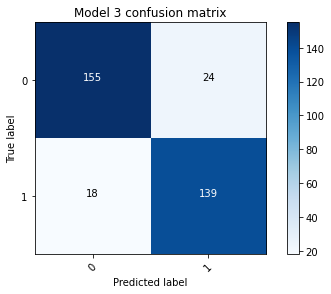

In [147]:
pred_3_classes = np.rint(pred_3)
confusion_mtx = confusion_matrix(test_labels, pred_3_classes)
plot_confusion_matrix(confusion_mtx, classes = range(2), normalize=False, title='Model 3 confusion matrix')

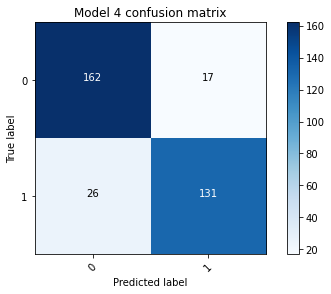

In [148]:
pred_4_classes = np.rint(pred_4)
confusion_mtx = confusion_matrix(test_labels, pred_4_classes)
plot_confusion_matrix(confusion_mtx, classes = range(2), normalize=False, title='Model 4 confusion matrix')

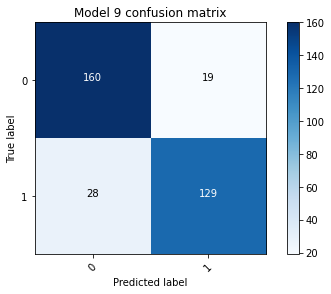

In [149]:
pred_9_classes = np.rint(pred_9)
confusion_mtx = confusion_matrix(test_labels, pred_9_classes)
plot_confusion_matrix(confusion_mtx, classes = range(2), normalize=False, title='Model 9 confusion matrix')

In [150]:
def plot_roc(preds, names, titles='ROC curve'):
    plt.figure(figsize=(10, 8), dpi=80, facecolor='w', edgecolor='k')
    for pred, name in zip(preds, names):
        fpr, tpr, _ = roc_curve(test_labels, pred)
        auc_keras = auc(fpr, tpr)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label=(name +' (area = {:.3f})'.format(auc_keras)))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='lower right')
    plt.show()

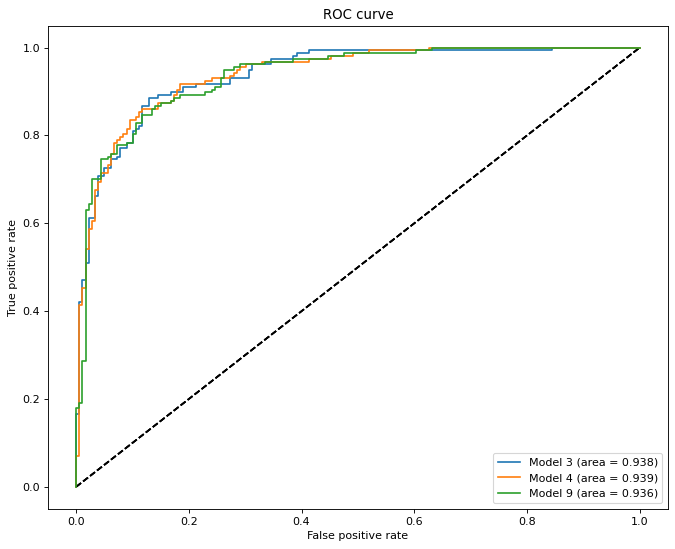

In [151]:
plot_roc([pred_3, pred_4, pred_9], names=['Model 3', 'Model 4', 'Model 9'])

DESCRIPTIVE ERROR ANALYSIS

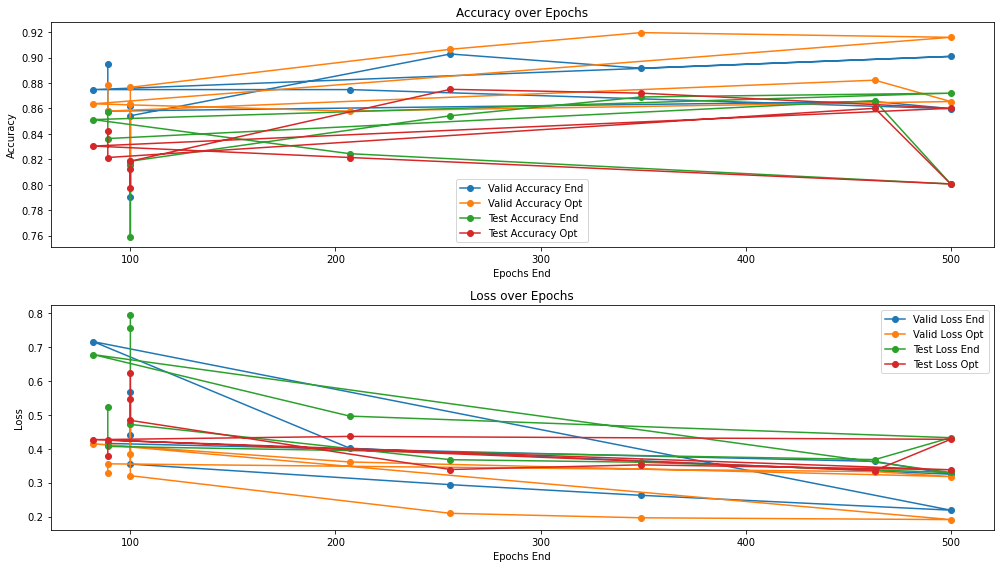

In [152]:
plt.figure(figsize=(14, 8))

# Line plot for Valid and Test Accuracy
plt.subplot(2, 1, 1)
plt.plot(df['Epochs End'], df['Valid Accuracy End'], marker='o', label='Valid Accuracy End')
plt.plot(df['Epochs End'], df['Valid Accuracy Opt'], marker='o', label='Valid Accuracy Opt')
plt.plot(df['Epochs End'], df['Test Accuracy End'], marker='o', label='Test Accuracy End')
plt.plot(df['Epochs End'], df['Test Accuracy Opt'], marker='o', label='Test Accuracy Opt')
plt.xlabel('Epochs End')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()

# Line plot for Valid and Test Loss
plt.subplot(2, 1, 2)
plt.plot(df['Epochs End'], df['Valid Loss End'], marker='o', label='Valid Loss End')
plt.plot(df['Epochs End'], df['Valid Loss Opt'], marker='o', label='Valid Loss Opt')
plt.plot(df['Epochs End'], df['Test Loss End'], marker='o', label='Test Loss End')
plt.plot(df['Epochs End'], df['Test Loss Opt'], marker='o', label='Test Loss Opt')
plt.xlabel('Epochs End')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

<Figure size 864x432 with 0 Axes>

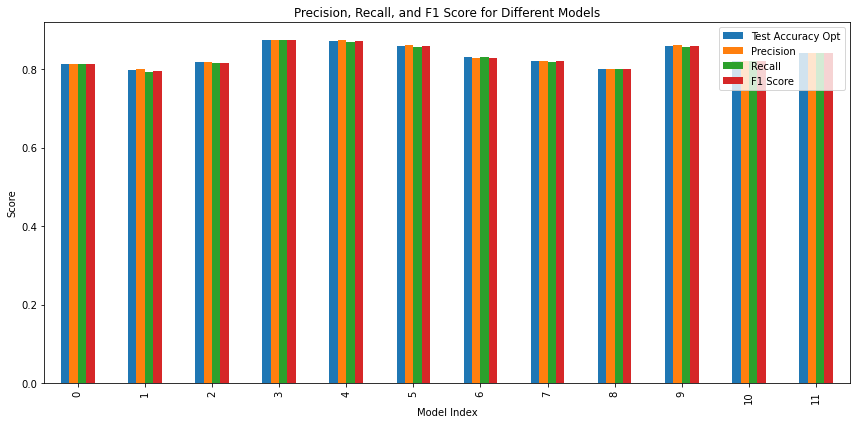

In [155]:
plt.figure(figsize=(12, 6))

# Bar plot for Precision, Recall, and F1 Score
df[['Test Accuracy Opt','Precision', 'Recall', 'F1 Score']].plot(kind='bar', figsize=(12, 6))
plt.xlabel('Model Index')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for Different Models')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

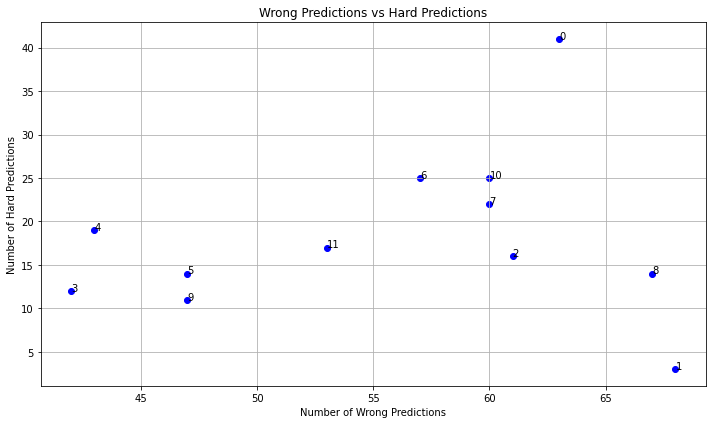

In [156]:
plt.figure(figsize=(10, 6))

# Scatter plot for Number of Wrong Predictions vs Number of Hard Predictions
plt.scatter(df['Number of Wrong Predictions'], df['Number of Hard Predictions'], c='blue', marker='o')
for i, txt in enumerate(df.index):
    plt.annotate(txt, (df['Number of Wrong Predictions'][i], df['Number of Hard Predictions'][i]))

plt.xlabel('Number of Wrong Predictions')
plt.ylabel('Number of Hard Predictions')
plt.title('Wrong Predictions vs Hard Predictions')
plt.grid(True)

plt.tight_layout()
plt.show()

# INFERENTIAL ANALYSIS

In [184]:
# Extracting data for models 3, 4, and 9
top_models = df.loc[[3, 4, 9]].reset_index()
print(top_models)
top_models

,index,Epochs End,Epochs Opt,Valid Accuracy End,Valid Accuracy Opt,Test Accuracy End,Test Accuracy Opt,Valid Loss End,Valid Loss Opt,Test Loss End,Test Loss Opt,Precision,Recall,F1 Score,Number of Wrong Predictions,Number of Hard Predictions
0,3,256,216,0.9028,0.9065,0.8542,0.8750,0.2941,0.2094,0.3679,0.3389,0.8744,0.8756,0.8747,42,12
1,4,349,269,0.8916,0.9196,0.8690,0.8720,0.2626,0.1962,0.3604,0.3527,0.8734,0.8697,0.8709,43,19
2,9,463,383,0.8654,0.8822,0.8661,0.8601,0.3629,0.3326,0.3682,0.3359,0.8613,0.8578,0.8589,47,11


In [185]:
# Save the DataFrame to a CSV file
top_models.to_csv('top_models.csv', index=False)

# Optionally, print a message to confirm the save
print("DataFrame saved to 'top_models.csv' successfully.")

In [171]:
summary_stats = top_models[['Test Accuracy Opt', 'Precision', 'Recall', 'F1 Score']].describe()
print(summary_stats)
summary_stats

,Test Accuracy Opt,Precision,Recall,F1 Score
count,3.000000,3.000000,3.000000,3.000000
mean,0.869033,0.869700,0.867700,0.868167
std,0.007881,0.007292,0.009067,0.008247
min,0.860100,0.861300,0.857800,0.858900
25%,0.866050,0.867350,0.863750,0.864900
50%,0.872000,0.873400,0.869700,0.870900
75%,0.873500,0.873900,0.872650,0.872800
max,0.875000,0.874400,0.875600,0.874700


In [176]:
from statsmodels.stats.anova import AnovaRM

# Assuming df is already defined with the relevant data

# Extracting data for models 3, 4, and 9
top_models = df.loc[[3, 4, 9]].reset_index()

# Reshape the data for repeated measures ANOVA
metrics = ['Test Accuracy Opt', 'Precision', 'Recall', 'F1 Score']
data_long = pd.melt(top_models, id_vars=['index', 'Epochs Opt'], value_vars=metrics,
                    var_name='Metric', value_name='Value')

# Add a 'Model' column based on the index values
data_long['Model'] = data_long['index'].apply(lambda x: f'Model {x}')

# Repeated Measures ANOVA
rm_anova = AnovaRM(data_long, 'Value', 'Model', within=['Metric'])
anova_results = rm_anova.fit()


In [182]:
# Extract ANOVA table into a DataFrame
anova_table = pd.DataFrame(anova_results.anova_table)

# Print ANOVA table
print(anova_table)

anova_table

,F Value,Num DF,Den DF,Pr > F
Metric,1.803065,3.0,6.0,0.246752


In [183]:
from statsmodels.stats.anova import AnovaRM

# Extracting data for models 3, 4, and 9
top_models = df.loc[[3, 4, 9]].reset_index()

# Reshape the data for repeated measures ANOVA
metrics = ['Test Accuracy Opt', 'Precision', 'Recall', 'F1 Score']
data_long = pd.melt(top_models, id_vars=['index'], value_vars=metrics,
                    var_name='Metric', value_name='Value')

# Add a 'Model' column based on the index values
data_long['Model'] = data_long['index'].apply(lambda x: f'Model {x}')

# Perform Repeated Measures ANOVA
rm_anova = AnovaRM(data_long, 'Value', 'Model', within=['Metric'])
anova_results = rm_anova.fit()

# Extract ANOVA table into a DataFrame
anova_table = pd.DataFrame(anova_results.anova_table)

# Print ANOVA table
print(anova_table)

# Display ANOVA table in an interactive environment
anova_table

,F Value,Num DF,Den DF,Pr > F
Metric,1.803065,3.0,6.0,0.246752


In [2]:
# Load the data (update the filename if it's different)
file_path = "model_results.xlsx"  # Replace with your actual file path if necessary
data = pd.read_excel(file_path)

                             No_of_CNN  Valid_Accuracy_Opt  Test_Accuracy_Opt  \
No_of_CNN                     1.000000            0.408338           0.513368   
Valid_Accuracy_Opt            0.408338            1.000000           0.868539   
Test_Accuracy_Opt             0.513368            0.868539           1.000000   
Number_of_Wrong_Predictions  -0.513531           -0.868431          -0.999999   
Number_of_Hard_Predictions   -0.135935            0.005038          -0.160332   
Precision                     0.502967            0.861133           0.998852   
Recall                        0.508834            0.874232           0.998139   
F1_Score                      0.514878            0.873082           0.999681   

                             Number_of_Wrong_Predictions  \
No_of_CNN                                      -0.513531   
Valid_Accuracy_Opt                             -0.868431   
Test_Accuracy_Opt                              -0.999999   
Number_of_Wrong_Predictions   

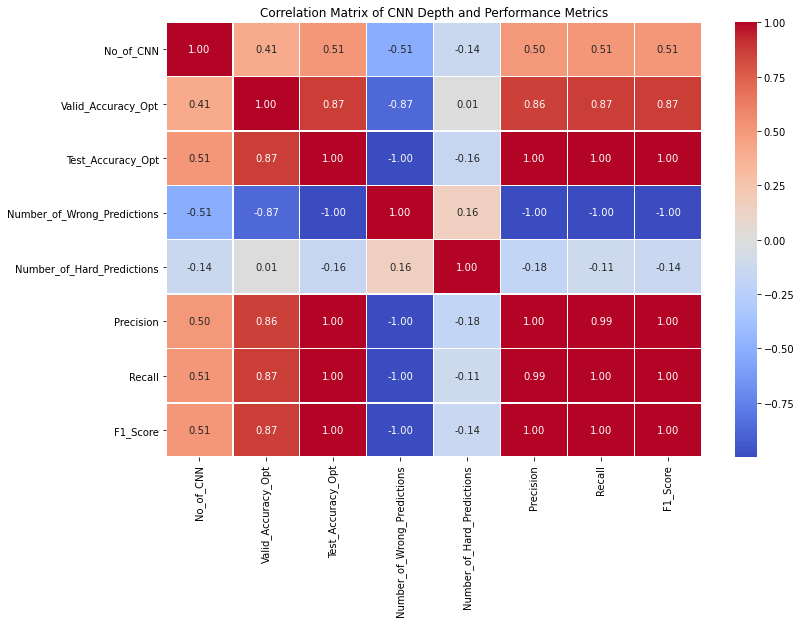

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = data[['No_of_CNN', 'Valid_Accuracy_Opt', 'Test_Accuracy_Opt',
                           'Number_of_Wrong_Predictions', 'Number_of_Hard_Predictions',
                           'Precision', 'Recall', 'F1_Score']].corr()

# Display the correlation matrix
print(correlation_matrix)

# Visualize the correlations using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of CNN Depth and Performance Metrics')
plt.show()


In [8]:
from scipy.stats import shapiro

# Get the residuals from the regression models
residuals_wrong = model_wrong.resid
residuals_hard = model_hard.resid

# Shapiro-Wilk test for normality
shapiro_test_wrong = shapiro(residuals_wrong)
shapiro_test_hard = shapiro(residuals_hard)

print("Shapiro-Wilk test for 'Number_of_Wrong_Predictions' residuals:", shapiro_test_wrong)
print("Shapiro-Wilk test for 'Number_of_Hard_Predictions' residuals:", shapiro_test_hard)

Shapiro-Wilk test for 'Number_of_Wrong_Predictions' residuals: ShapiroResult(statistic=0.9320955276489258, pvalue=0.40285423398017883)
Shapiro-Wilk test for 'Number_of_Hard_Predictions' residuals: ShapiroResult(statistic=0.9482382535934448, pvalue=0.6113883256912231)


In [6]:
import statsmodels.api as sm

# Regression 1: Number_of_Wrong_Predictions on No_of_CNN
# ------------------------------------------------------
# Define the independent variable (CNN depth)
X_wrong = data[['No_of_CNN']]

# Define the dependent variable (Number of Wrong Predictions)
y_wrong = data['Number_of_Wrong_Predictions']

# Add a constant to the independent variables (this is the intercept)
X_wrong = sm.add_constant(X_wrong)

# Fit the regression model
model_wrong = sm.OLS(y_wrong, X_wrong).fit()

# Print the summary of the regression
print("Regression of Number_of_Wrong_Predictions on No_of_CNN")
print(model_wrong.summary())


Regression of Number_of_Wrong_Predictions on No_of_CNN
                                 OLS Regression Results                                
Dep. Variable:     Number_of_Wrong_Predictions   R-squared:                       0.264
Model:                                     OLS   Adj. R-squared:                  0.190
Method:                          Least Squares   F-statistic:                     3.582
Date:                         Sat, 24 Aug 2024   Prob (F-statistic):             0.0877
Time:                                 07:41:02   Log-Likelihood:                -41.140
No. Observations:                           12   AIC:                             86.28
Df Residuals:                               10   BIC:                             87.25
Df Model:                                    1                                         
Covariance Type:                     nonrobust                                         
                 coef    std err          t      P>|t|      [0.02

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [7]:

# Regression 2: Number_of_Hard_Predictions on No_of_CNN
# ------------------------------------------------------
# Define the independent variable (CNN depth)
X_hard = data[['No_of_CNN']]

# Define the dependent variable (Number of Hard Predictions)
y_hard = data['Number_of_Hard_Predictions']

# Add a constant to the independent variables (this is the intercept)
X_hard = sm.add_constant(X_hard)

# Fit the regression model
model_hard = sm.OLS(y_hard, X_hard).fit()

# Print the summary of the regression
print("\nRegression of Number_of_Hard_Predictions on No_of_CNN")
print(model_hard.summary())


Regression of Number_of_Hard_Predictions on No_of_CNN
                                OLS Regression Results                                
Dep. Variable:     Number_of_Hard_Predictions   R-squared:                       0.018
Model:                                    OLS   Adj. R-squared:                 -0.080
Method:                         Least Squares   F-statistic:                    0.1883
Date:                        Sat, 24 Aug 2024   Prob (F-statistic):              0.674
Time:                                07:43:23   Log-Likelihood:                -43.394
No. Observations:                          12   AIC:                             90.79
Df Residuals:                              10   BIC:                             91.76
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

C:\Users\CHRISTIANAH\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
